<a href="https://colab.research.google.com/github/ojrestrepom/tesis-registro-multimodal-temporal/blob/main/notebooks/Notebook_2_Registro_Temporal_HSI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from pathlib import Path

BASE = Path('/content/drive/MyDrive/Tesis Maestría')
DATA_ROOT = BASE / 'Datos_HSI'

for item in DATA_ROOT.iterdir():
    print(item)

/content/drive/MyDrive/Tesis Maestría/Datos_HSI/Registradas_Procesadas


In [ ]:
DATA_DIR = DATA_ROOT / 'Registradas_Procesadas'

print(f'Existe: {DATA_DIR.exists()}')
print(f'Es carpeta: {DATA_DIR.is_dir()}')

Existe: True
Es carpeta: True


In [ ]:
!pip -q install spectral

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.2/215.2 kB 14.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
import spectral
import numpy as np

FOLIOLO = 3
CARA = 'haz'
DIA = 3

HDR = DATA_DIR / f'foliolo{FOLIOLO}' / CARA / f'foliolo{FOLIOLO}_{CARA}_a{DIA}.hdr'

print(HDR)
print(f'HDR existe: {HDR.exists()}')
print(f'IMG existe: {HDR.with_suffix(".img").exists()}')

/content/drive/MyDrive/Tesis Maestría/Datos_HSI/Registradas_Procesadas/foliolo3/haz/foliolo3_haz_a3.hdr
HDR existe: True
IMG existe: True


In [ ]:
img = spectral.open_image(str(HDR))

print('Dimensiones:', img.shape)
print('Tipo:', img.dtype)
print('Interleave:', img.metadata.get('interleave'))
print('Bandas:', img.metadata.get('bands'))
print('Longitudes de onda:', len(img.metadata.get('wavelength', [])))

Dimensiones: (327, 226, 111)
Tipo: <f4
Interleave: bip
Bandas: 111
Longitudes de onda: 111


In [ ]:
wavelengths = np.array(img.metadata.get('wavelength', []), dtype=float)

print(f'Primera longitud de onda: {wavelengths[0]:.2f} nm')
print(f'Última longitud de onda:  {wavelengths[-1]:.2f} nm')
print(f'Número de bandas:         {len(wavelengths)}')

print('\nPrimeras 10:')
print(np.round(wavelengths[:10], 2))

print('\nÚltimas 10:')
print(np.round(wavelengths[-10:], 2))

Primera longitud de onda: 401.59 nm
Última longitud de onda:  998.17 nm
Número de bandas:         111

Primeras 10:
[401.59 406.82 412.06 417.31 422.55 427.8  433.06 438.32 443.58 448.84]

Últimas 10:
[948.98 954.59 960.2  965.82 971.44 977.06 982.68 988.31 993.94 998.17]


In [ ]:
cube = np.asarray(img.load())

print('Shape:', cube.shape)
print('dtype:', cube.dtype)
print('Mínimo:', np.nanmin(cube))
print('Máximo:', np.nanmax(cube))
print('Media:', np.nanmean(cube))
print('NaN:', np.isnan(cube).sum())

Shape: (327, 226, 111)
dtype: float32
Mínimo: 0.0
Máximo: 0.6141702
Media: 0.09470036
NaN: 0


In [ ]:
def banda_mas_cercana(wavelengths, objetivo):
    idx = np.argmin(np.abs(wavelengths - objetivo))
    return idx, wavelengths[idx]

for nombre, objetivo in [('R', 650), ('G', 550), ('B', 450)]:
    idx, wl = banda_mas_cercana(wavelengths, objetivo)
    print(f'{nombre}: banda {idx} → {wl:.2f} nm')

R: banda 47 → 651.64 nm
G: banda 28 → 549.58 nm
B: banda 9 → 448.84 nm


In [ ]:
def normalizar_banda(banda, p_low=2, p_high=98):
    lo, hi = np.nanpercentile(banda, [p_low, p_high])

    if hi <= lo:
        return np.zeros_like(banda)

    banda = (banda - lo) / (hi - lo)
    return np.nan_to_num(np.clip(banda, 0, 1), nan=0.0)

def crear_pseudorgb(cube, wavelengths):
    idx_r = np.argmin(np.abs(wavelengths - 650))
    idx_g = np.argmin(np.abs(wavelengths - 550))
    idx_b = np.argmin(np.abs(wavelengths - 450))

    r = normalizar_banda(cube[:, :, idx_r])
    g = normalizar_banda(cube[:, :, idx_g])
    b = normalizar_banda(cube[:, :, idx_b])

    return np.dstack([r, g, b])

## 2. Construcción de la secuencia temporal HSI

En esta sección se identifican las adquisiciones disponibles para un mismo foliolo y una misma cara.

El objetivo es organizar las imágenes HSI como una secuencia temporal:

$ I_{t_1}, I_{t_2}, \ldots, I_{t_n} $

que posteriormente permitirá evaluar el registro entre imágenes adquiridas con diferentes separaciones temporales $\\Delta t\$.

Inicialmente se trabajará con el foliolo 3, cara haz, utilizando las adquisiciones disponibles entre a3 y a13.

In [ ]:
# Celda 11 - Identificar las adquisiciones temporales disponibles

import re

FOLIOLO = 3
CARA = 'haz'

FOLIOLO_DIR = DATA_DIR / f'foliolo{FOLIOLO}' / CARA
hdr_files = sorted(FOLIOLO_DIR.glob(f'foliolo{FOLIOLO}_{CARA}_a*.hdr'))

# Extraer el número de adquisición (a3, a4, ..., an) desde el nombre del archivo
adquisiciones = []
for hdr in hdr_files:
    match = re.search(r'_a(\d+)\.hdr$', hdr.name)
    if match:
        adquisiciones.append((int(match.group(1)), hdr))

# Ordenar cronológicamente por número de adquisición
adquisiciones.sort(key=lambda x: x[0])

print(f'Foliolo: {FOLIOLO}')
print(f'Cara: {CARA}')
print(f'Directorio: {FOLIOLO_DIR}')
print(f'Número de adquisiciones: {len(adquisiciones)}\n')

for dia, hdr in adquisiciones:
    img_ok = hdr.with_suffix('.img').exists()
    print(f'a{dia:02d} | HDR: ✓ | IMG: {"✓" if img_ok else "✗"} | {hdr.name}')

Foliolo: 3
Cara: haz
Directorio: /content/drive/MyDrive/Tesis Maestría/Datos_HSI/Registradas_Procesadas/foliolo3/haz
Número de adquisiciones: 12

a03 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a3.hdr
a04 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a4.hdr
a05 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a5.hdr
a06 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a6.hdr
a07 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a7.hdr
a08 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a8.hdr
a09 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a9.hdr
a10 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a10.hdr
a11 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a11.hdr
a12 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a12.hdr
a13 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a13.hdr
a14 | HDR: ✓ | IMG: ✓ | foliolo3_haz_a14.hdr


### 2.1 Carga general de adquisiciones HSI

Se define una función para cargar cualquier adquisición HSI a partir del foliolo,
la cara y el instante de adquisición.

La función centraliza la lectura de los archivos ENVI (`.hdr` + `.img`) y retorna:

- el cubo hiperespectral;
- las longitudes de onda;
- los metadatos de la adquisición;
- la ruta del archivo utilizado.

Esto permitirá procesar toda la secuencia temporal mediante un mismo procedimiento,
evitando código específico para cada par de imágenes.

In [ ]:
# Celda 12 - Función general para cargar una adquisición HSI

def cargar_hsi(foliolo, cara, dia, data_dir=DATA_DIR):
    hdr = data_dir / f'foliolo{foliolo}' / cara / f'foliolo{foliolo}_{cara}_a{dia}.hdr'

    if not hdr.exists():
        raise FileNotFoundError(f'No se encontró el archivo HDR: {hdr}')
    if not hdr.with_suffix('.img').exists():
        raise FileNotFoundError(f'No se encontró el archivo IMG: {hdr.with_suffix(".img")}')

    img = spectral.open_image(str(hdr))
    cube = np.asarray(img.load())
    wavelengths = np.asarray(img.metadata.get('wavelength', []), dtype=float)

    return {
        'cube': cube,
        'wavelengths': wavelengths,
        'metadata': img.metadata,
        'hdr': hdr
    }

### 2.2 Verificación de consistencia de la secuencia temporal

Antes de realizar registros entre adquisiciones se verifica que todos los cubos
presenten dimensiones y número de bandas compatibles y que utilicen las mismas
longitudes de onda.

Esta comprobación es importante porque una diferencia entre adquisiciones podría
introducir un problema adicional que no corresponde al registro temporal.

In [ ]:
# Celda 13 - Verificar dimensiones y longitudes de onda de toda la secuencia

secuencia = {}
wl_ref = None

for dia, _ in adquisiciones:
    data = cargar_hsi(FOLIOLO, CARA, dia)
    secuencia[dia] = data

    cube_d = data['cube']
    wl_d = data['wavelengths']

    if wl_ref is None:
        wl_ref = wl_d

    mismas_wl = len(wl_d) == len(wl_ref) and np.allclose(wl_d, wl_ref)

    print(
        f'a{dia:02d} | shape={cube_d.shape} | '
        f'dtype={cube_d.dtype} | wavelengths={"✓" if mismas_wl else "✗"}'
    )

a03 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓
a04 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓
a05 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓
a06 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓
a07 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓
a08 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓


/usr/local/lib/python3.13/dist-packages/spectral/io/spyfile.py:224: NaNValueWarning: Image data contains NaN values.
  warnings.warn('Image data contains NaN values.', NaNValueWarning)


a09 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓
a10 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓
a11 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓
a12 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓
a13 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓
a14 | shape=(327, 226, 111) | dtype=float32 | wavelengths=✓


### 2.3 Control de calidad de los cubos HSI

La carga de la secuencia generó una advertencia sobre la presencia de valores `NaN`
en al menos una adquisición.

Antes de realizar cualquier registro, se cuantifican y localizan estos valores para
determinar si corresponden a píxeles aislados, regiones espaciales o bandas
espectrales específicas.

Este control evita que valores no válidos afecten posteriormente la construcción de
representaciones, el cálculo de métricas o los algoritmos de registro.

In [ ]:
# Celda 14 - Cuantificar valores NaN en cada adquisición HSI

for dia, data in secuencia.items():
    cube_d = data['cube']
    n_nan = np.isnan(cube_d).sum()
    pct_nan = 100 * n_nan / cube_d.size

    print(f'a{dia:02d} | NaN={n_nan:,} | {pct_nan:.6f}%')

a03 | NaN=0 | 0.000000%
a04 | NaN=0 | 0.000000%
a05 | NaN=0 | 0.000000%
a06 | NaN=0 | 0.000000%
a07 | NaN=0 | 0.000000%
a08 | NaN=0 | 0.000000%
a09 | NaN=556 | 0.006778%
a10 | NaN=0 | 0.000000%
a11 | NaN=0 | 0.000000%
a12 | NaN=0 | 0.000000%
a13 | NaN=0 | 0.000000%
a14 | NaN=0 | 0.000000%


In [ ]:
# Celda 15 - Analizar la distribución espacial y espectral de los NaN

dias_con_nan = [dia for dia, data in secuencia.items() if np.isnan(data['cube']).any()]

for dia in dias_con_nan:
    cube_d = secuencia[dia]['cube']
    mask_nan = np.isnan(cube_d)

    # Píxeles espaciales con al menos un NaN y con las 111 bandas NaN
    pix_alguno = np.any(mask_nan, axis=2)
    pix_todos = np.all(mask_nan, axis=2)

    # Cantidad de NaN por banda
    nan_por_banda = np.sum(mask_nan, axis=(0, 1))
    bandas_afectadas = np.where(nan_por_banda > 0)[0]

    print(f'\nAdquisición a{dia}')
    print(f'NaN totales: {mask_nan.sum():,}')
    print(f'Píxeles con ≥1 NaN: {pix_alguno.sum():,}')
    print(f'Píxeles con todas las bandas NaN: {pix_todos.sum():,}')
    print(f'Bandas afectadas: {len(bandas_afectadas)} / {cube_d.shape[2]}')

    if len(bandas_afectadas):
        print(f'Rango de bandas afectadas: {bandas_afectadas[0]}–{bandas_afectadas[-1]}')


Adquisición a9
NaN totales: 556
Píxeles con ≥1 NaN: 31
Píxeles con todas las bandas NaN: 0
Bandas afectadas: 57 / 111
Rango de bandas afectadas: 0–110


### 2.4 Distribución de los valores NaN en la adquisición a9

Los valores no válidos detectados en `a9` representan una fracción muy pequeña del
cubo (0.006778 %) y afectan 31 píxeles espaciales. Ningún píxel presenta pérdida de
información en todas las bandas.

Se analiza su distribución espacial y el número de bandas afectadas por píxel antes
de definir una estrategia de tratamiento.

In [ ]:
# Celda 16 - Examinar cuántas bandas NaN presenta cada píxel afectado en a9

cube_a9 = secuencia[9]['cube']
mask_nan = np.isnan(cube_a9)

nan_por_pixel = np.sum(mask_nan, axis=2)
coords_nan = np.argwhere(nan_por_pixel > 0)
valores_nan = nan_por_pixel[nan_por_pixel > 0]

print(f'Píxeles afectados: {len(coords_nan)}')
print(f'Mínimo de bandas NaN por píxel: {valores_nan.min()}')
print(f'Máximo de bandas NaN por píxel: {valores_nan.max()}')
print(f'Mediana: {np.median(valores_nan):.1f}')
print(f'Media: {np.mean(valores_nan):.2f}')

print('\nCoordenadas (fila, columna) y número de bandas NaN:')
for (fila, col), n in zip(coords_nan, valores_nan):
    print(f'({fila:3d}, {col:3d}) → {n:2d} bandas')

Píxeles afectados: 31
Mínimo de bandas NaN por píxel: 4
Máximo de bandas NaN por píxel: 34
Mediana: 19.0
Media: 17.94

Coordenadas (fila, columna) y número de bandas NaN:
(220, 111) →  4 bandas
(220, 112) →  4 bandas
(220, 113) →  4 bandas
(221, 105) →  5 bandas
(221, 106) → 16 bandas
(221, 107) → 24 bandas
(221, 108) → 34 bandas
(221, 109) → 29 bandas
(221, 110) → 34 bandas
(221, 111) → 19 bandas
(221, 112) →  4 bandas
(221, 113) →  4 bandas
(222, 105) →  5 bandas
(222, 106) → 16 bandas
(222, 107) → 24 bandas
(222, 108) → 34 bandas
(222, 109) → 29 bandas
(222, 110) → 34 bandas
(222, 111) → 19 bandas
(222, 112) →  4 bandas
(222, 113) →  4 bandas
(223, 105) →  5 bandas
(223, 106) → 16 bandas
(223, 107) → 24 bandas
(223, 108) → 34 bandas
(223, 109) → 29 bandas
(223, 110) → 34 bandas
(223, 111) → 19 bandas
(224, 105) →  5 bandas
(224, 106) → 16 bandas
(224, 107) → 24 bandas


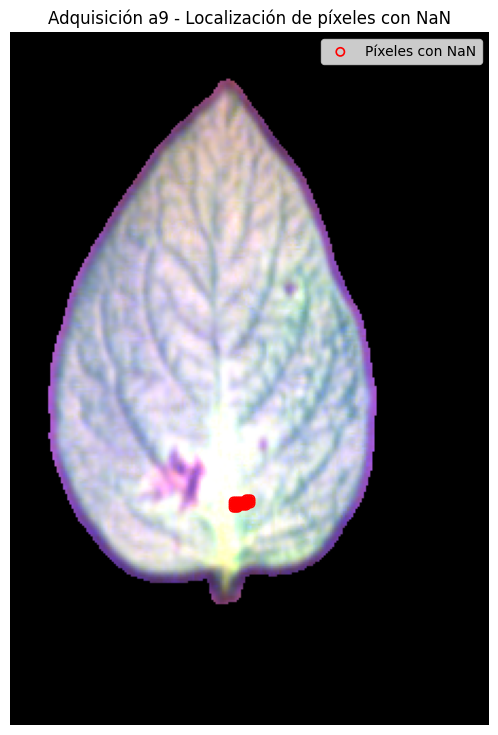

In [ ]:
# Celda 17 - Visualizar la ubicación espacial de los píxeles con NaN en a9

import matplotlib.pyplot as plt

pseudo_a9 = crear_pseudorgb(cube_a9, secuencia[9]['wavelengths'])

plt.figure(figsize=(7, 9))
plt.imshow(pseudo_a9)

if len(coords_nan):
    plt.scatter(coords_nan[:, 1], coords_nan[:, 0], s=35, facecolors='none',
                edgecolors='red', linewidths=1.2, label='Píxeles con NaN')

plt.title('Adquisición a9 - Localización de píxeles con NaN')
plt.axis('off')
plt.legend()
plt.show()

In [ ]:
# Celda 18 - Interpolar NaN utilizando el eje real de longitudes de onda

def interpolar_nan_espectral(cube, wavelengths):
    cube_out = cube.copy()
    filas, cols = np.where(np.any(np.isnan(cube_out), axis=2))

    for fila, col in zip(filas, cols):
        espectro = cube_out[fila, col, :]
        validos = ~np.isnan(espectro)

        if validos.sum() >= 2:
            espectro[~validos] = np.interp(
                wavelengths[~validos],
                wavelengths[validos],
                espectro[validos]
            )
            cube_out[fila, col, :] = espectro

    return cube_out

cube_a9_corregido = interpolar_nan_espectral(
    secuencia[9]['cube'],
    secuencia[9]['wavelengths']
)

print(f'NaN antes:   {np.isnan(secuencia[9]["cube"]).sum():,}')
print(f'NaN después: {np.isnan(cube_a9_corregido).sum():,}')

NaN antes:   556
NaN después: 0


### 2.6 Construcción de los cubos de trabajo

Se construye una colección independiente para los experimentos posteriores.

Los cubos originales permanecen almacenados en `secuencia`, mientras que
`cubos_procesados` contiene las versiones utilizadas durante el procesamiento.
En la adquisición `a9`, los valores espectrales no válidos son sustituidos por
los valores obtenidos mediante interpolación espectral.

Esta separación permite conservar la trazabilidad entre los datos originales
y los datos utilizados experimentalmente.

In [ ]:
# Celda 19 - Crear colección de cubos para los experimentos

cubos_procesados = {
    dia: data['cube'].copy()
    for dia, data in secuencia.items()
}

cubos_procesados[9] = cube_a9_corregido

print(f'Adquisiciones procesadas: {len(cubos_procesados)}')
print(f'Días: {sorted(cubos_procesados.keys())}')
print(f'NaN totales: {sum(np.isnan(cube).sum() for cube in cubos_procesados.values()):,}')

Adquisiciones procesadas: 12
Días: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
NaN totales: 0


## 3. Inspección visual de la secuencia temporal

Antes de aplicar algoritmos de registro se realiza una inspección visual de las
12 adquisiciones HSI disponibles (a3–a14).

Para facilitar la interpretación, cada cubo hiperespectral se representa mediante
una pseudo-RGB construida a partir de las bandas más cercanas a 650 nm, 550 nm y
450 nm.

Esta visualización permite identificar cualitativamente cambios de posición,
orientación, escala, forma y estructura interna del foliolo a lo largo de la
secuencia temporal, así como posibles anomalías entre adquisiciones.

La pseudo-RGB se utiliza únicamente como representación visual del cubo HSI y no
implica todavía que sea la representación seleccionada para realizar el registro.

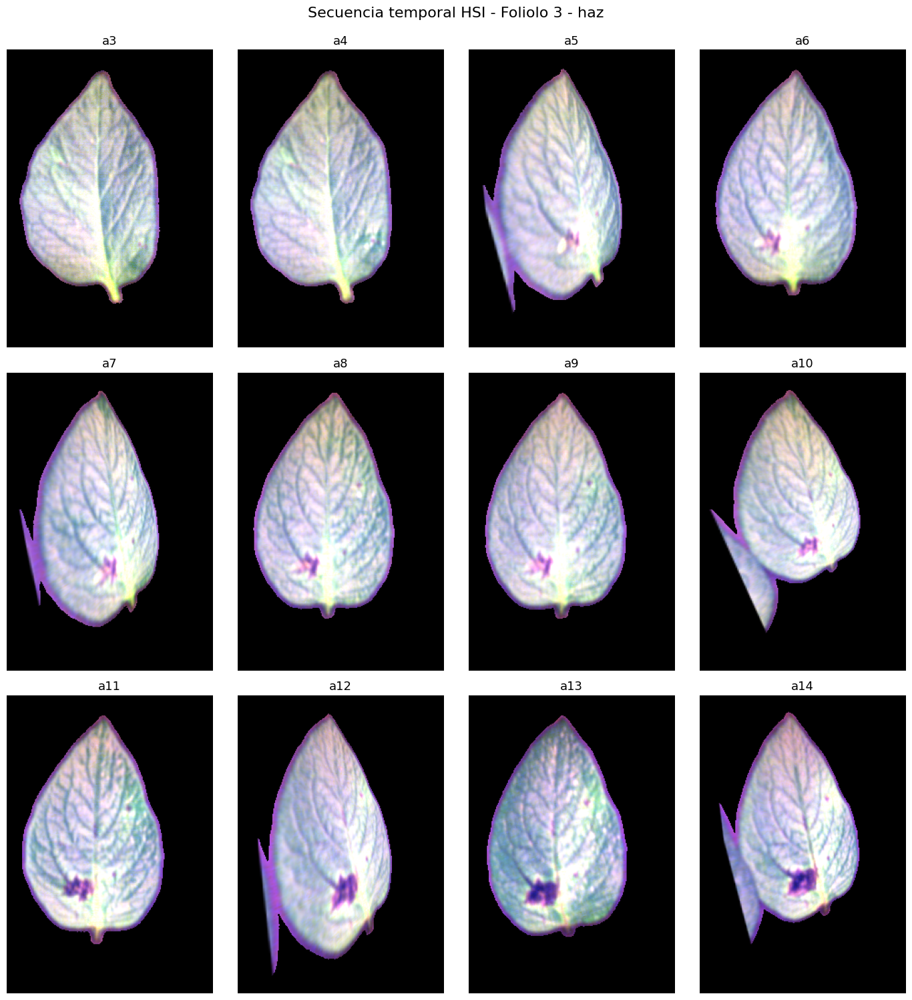

In [ ]:
# Celda 20 - Visualizar cronológicamente las adquisiciones a3–a14 en pseudo-RGB

import matplotlib.pyplot as plt

dias = sorted(cubos_procesados.keys())

fig, axes = plt.subplots(3, 4, figsize=(14, 15))
axes = axes.ravel()

for ax, dia in zip(axes, dias):
    pseudo_rgb = crear_pseudorgb(
        cubos_procesados[dia],
        secuencia[dia]['wavelengths']
    )

    ax.imshow(pseudo_rgb)
    ax.set_title(f'a{dia}', fontsize=13)
    ax.axis('off')

plt.suptitle(
    f'Secuencia temporal HSI - Foliolo {FOLIOLO} - {CARA}',
    fontsize=16,
    y=0.995
)

plt.tight_layout()
plt.show()

## 4. Delimitación espacial del objeto de interés

La inspección visual de la secuencia evidencia la presencia de estructuras ajenas al
foliolo principal en algunas adquisiciones (especialmente a5, a7, a10, a12 y a14).

Estas regiones pueden interferir con el cálculo de similitud y con la estimación de
las transformaciones de registro.

Por esta razón, se construirá una máscara binaria del foliolo principal para
delimitar el objeto de interés. Las máscaras podrán utilizarse posteriormente tanto
en el proceso de registro como en su evaluación.

In [ ]:
# Celda 21 - Crear una máscara inicial del foliolo a partir de la pseudo-RGB

from scipy import ndimage

def crear_mascara_foliolo(cube, wavelengths):
    rgb = crear_pseudorgb(cube, wavelengths)

    # Intensidad media de la pseudo-RGB para separar tejido del fondo negro
    intensidad = np.mean(rgb, axis=2)
    mask = intensidad > 0.05

    # Limpiar pequeños artefactos
    mask = ndimage.binary_fill_holes(mask)
    labels, n = ndimage.label(mask)

    if n == 0:
        return mask

    # Conservar el componente conexo de mayor tamaño
    sizes = ndimage.sum(mask, labels, range(1, n + 1))
    principal = np.argmax(sizes) + 1

    return labels == principal

mascara_a3 = crear_mascara_foliolo(
    cubos_procesados[3],
    secuencia[3]['wavelengths']
)

print('Píxeles del foliolo:', mascara_a3.sum())
print(f'Cobertura: {100 * mascara_a3.mean():.2f}%')

Píxeles del foliolo: 26734
Cobertura: 36.17%


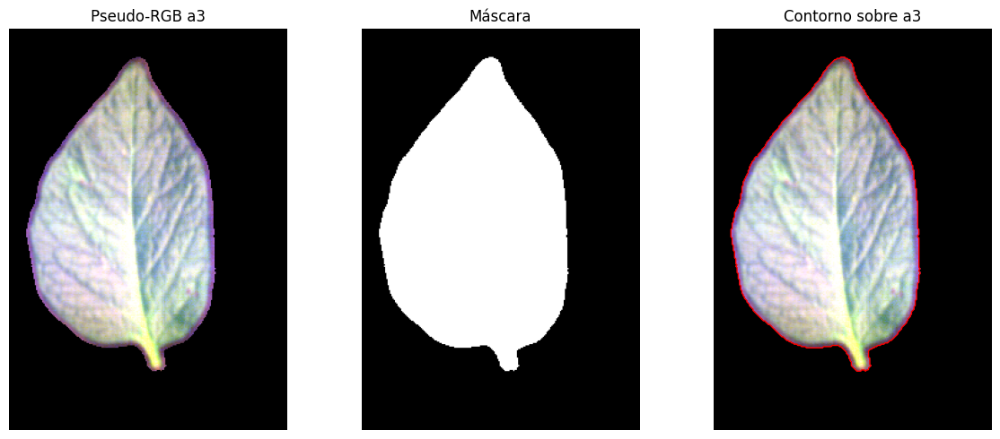

In [ ]:
# Celda 22 - Verificar la máscara obtenida para la adquisición a3

pseudo_a3 = crear_pseudorgb(
    cubos_procesados[3],
    secuencia[3]['wavelengths']
)

fig, axes = plt.subplots(1, 3, figsize=(12, 5))

axes[0].imshow(pseudo_a3)
axes[0].set_title('Pseudo-RGB a3')

axes[1].imshow(mascara_a3, cmap='gray')
axes[1].set_title('Máscara')

axes[2].imshow(pseudo_a3)
axes[2].contour(mascara_a3, levels=[0.5], colors='red', linewidths=1)
axes[2].set_title('Contorno sobre a3')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()

### 4.1 Evaluación de la máscara en toda la secuencia temporal

La estrategia de segmentación inicial delimita correctamente el foliolo en la
adquisición `a3`.

Para evaluar su comportamiento frente a la variabilidad temporal y experimental,
se aplica el mismo procedimiento y los mismos parámetros a todas las adquisiciones
(a3–a14).

Esta evaluación permite identificar adquisiciones en las que estructuras ajenas,
cambios geométricos o variaciones de intensidad puedan afectar la delimitación
automática del objeto de interés.

In [ ]:
# Celda 23 - Generar automáticamente las máscaras para toda la secuencia

mascaras = {}

for dia in dias:
    mascaras[dia] = crear_mascara_foliolo(
        cubos_procesados[dia],
        secuencia[dia]['wavelengths']
    )

    pixeles = mascaras[dia].sum()
    cobertura = 100 * mascaras[dia].mean()

    print(f'a{dia:02d} | píxeles={pixeles:5d} | cobertura={cobertura:5.2f}%')

a03 | píxeles=26734 | cobertura=36.17%
a04 | píxeles=26969 | cobertura=36.49%
a05 | píxeles=26301 | cobertura=35.59%
a06 | píxeles=26554 | cobertura=35.93%
a07 | píxeles=25849 | cobertura=34.98%
a08 | píxeles=26769 | cobertura=36.22%
a09 | píxeles=26713 | cobertura=36.15%
a10 | píxeles=23412 | cobertura=31.68%
a11 | píxeles=26694 | cobertura=36.12%
a12 | píxeles=26990 | cobertura=36.52%
a13 | píxeles=26826 | cobertura=36.30%
a14 | píxeles=23850 | cobertura=32.27%


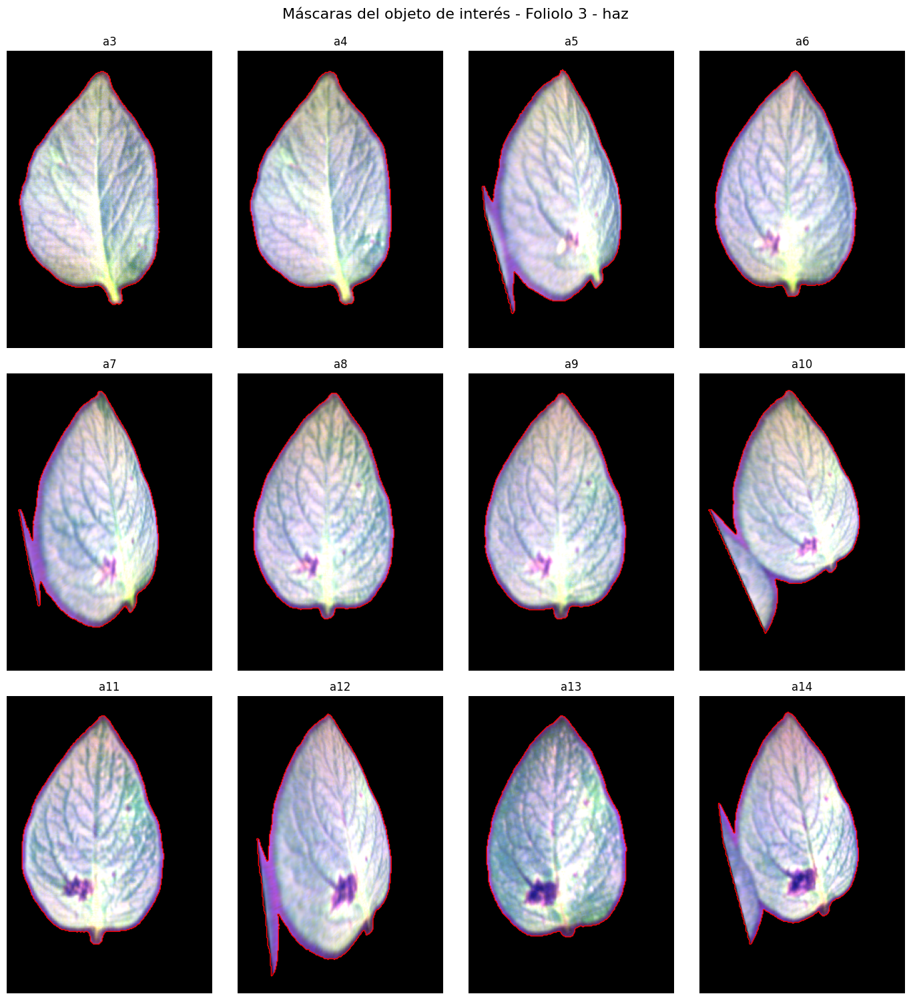

In [ ]:
# Celda 24 - Verificar visualmente las máscaras obtenidas en toda la secuencia

fig, axes = plt.subplots(3, 4, figsize=(14, 15))
axes = axes.ravel()

for ax, dia in zip(axes, dias):
    pseudo_rgb = crear_pseudorgb(
        cubos_procesados[dia],
        secuencia[dia]['wavelengths']
    )

    ax.imshow(pseudo_rgb)
    ax.contour(mascaras[dia], levels=[0.5], colors='red', linewidths=1)
    ax.set_title(f'a{dia}')
    ax.axis('off')

plt.suptitle(
    f'Máscaras del objeto de interés - Foliolo {FOLIOLO} - {CARA}',
    fontsize=16,
    y=0.995
)

plt.tight_layout()
plt.show()

### 4.2 Verificación de máscaras disponibles en el conjunto de datos

La segmentación automática basada en intensidad y componentes conexos incluye
estructuras foliares ajenas cuando estas se encuentran en contacto o superposición
con el foliolo objetivo.

Dado que el conjunto de datos dispone de archivos PNG asociados a las adquisiciones,
se inspeccionan estos archivos para determinar si contienen máscaras de referencia
del foliolo.

El uso de máscaras existentes permitiría delimitar el objeto de interés sin
introducir un problema adicional de segmentación dentro del estudio de registro.

In [ ]:
# Celda 25 - Identificar los archivos PNG asociados a la secuencia

png_files = sorted(FOLIOLO_DIR.glob('*.png'))

print(f'Número de archivos PNG: {len(png_files)}\n')

for png in png_files:
    print(png.name)

Número de archivos PNG: 0



### 4.3 Generación de imágenes para segmentación manual

La presencia de estructuras foliares parcialmente superpuestas impide delimitar
de forma fiable el foliolo objetivo mediante componentes conexos.

Dado el carácter exploratorio del experimento, se utilizarán máscaras manuales
para definir el objeto de interés. Esta decisión permite estudiar el problema de
registro independientemente del problema de segmentación.

Se generan representaciones pseudo-RGB de todas las adquisiciones conservando
las dimensiones espaciales originales. Estas imágenes serán segmentadas
manualmente y las máscaras resultantes se utilizarán como regiones de interés
durante los experimentos posteriores.

In [ ]:
# Celda 26 - Exportar pseudo-RGB para segmentación manual

from PIL import Image

MASK_ROOT = BASE / 'Notebook_2'
PSEUDORGB_DIR = MASK_ROOT / 'pseudoRGB_foliolo3_haz'
PSEUDORGB_DIR.mkdir(parents=True, exist_ok=True)

for dia in dias:
    pseudo_rgb = crear_pseudorgb(
        cubos_procesados[dia],
        secuencia[dia]['wavelengths']
    )

    # Convertir [0,1] a imagen RGB uint8 sin modificar las dimensiones espaciales
    rgb_uint8 = (pseudo_rgb * 255).round().astype(np.uint8)

    output = PSEUDORGB_DIR / f'foliolo{FOLIOLO}_{CARA}_a{dia}.png'
    Image.fromarray(rgb_uint8).save(output)

    print(f'a{dia:02d} | {rgb_uint8.shape} | {output.name}')

print(f'\nArchivos guardados en:\n{PSEUDORGB_DIR}')

a03 | (327, 226, 3) | foliolo3_haz_a3.png
a04 | (327, 226, 3) | foliolo3_haz_a4.png
a05 | (327, 226, 3) | foliolo3_haz_a5.png
a06 | (327, 226, 3) | foliolo3_haz_a6.png
a07 | (327, 226, 3) | foliolo3_haz_a7.png
a08 | (327, 226, 3) | foliolo3_haz_a8.png
a09 | (327, 226, 3) | foliolo3_haz_a9.png
a10 | (327, 226, 3) | foliolo3_haz_a10.png
a11 | (327, 226, 3) | foliolo3_haz_a11.png
a12 | (327, 226, 3) | foliolo3_haz_a12.png
a13 | (327, 226, 3) | foliolo3_haz_a13.png
a14 | (327, 226, 3) | foliolo3_haz_a14.png

Archivos guardados en:
/content/drive/MyDrive/Tesis Maestría/Notebook_2/pseudoRGB_foliolo3_haz


### 4.4 Inspección del conjunto de segmentaciones manuales

Las estructuras ajenas al foliolo objetivo fueron anotadas manualmente utilizando
Roboflow y exportadas en formato COCO Segmentation.

Las anotaciones se utilizarán como regiones de exclusión durante los experimentos
de registro. La división `train`/`valid` realizada por Roboflow no representa una
partición experimental en este estudio; únicamente corresponde a la organización
requerida durante la exportación del conjunto de anotaciones.

Antes de generar las máscaras se inspecciona la estructura del conjunto exportado,
los archivos disponibles y las dimensiones de las imágenes.

In [ ]:
# Celda 27 - Explorar la estructura del dataset exportado desde Roboflow

ROBOFLOW_DIR = BASE / 'Notebook_2' / 'pseudoRBG.coco-segmentation'

print(f'Ruta: {ROBOFLOW_DIR}')
print(f'Existe: {ROBOFLOW_DIR.exists()}')
print(f'Es carpeta: {ROBOFLOW_DIR.is_dir()}\n')

for path in sorted(ROBOFLOW_DIR.rglob('*')):
    if path.is_file():
        print(path.relative_to(ROBOFLOW_DIR))

Ruta: /content/drive/MyDrive/Tesis Maestría/Notebook_2/pseudoRBG.coco-segmentation
Existe: True
Es carpeta: True

README.dataset.txt
README.roboflow.txt
train/_annotations.coco.json
train/foliolo3_haz_a10_png.rf.iHpmPiGt6WnLnDrCDfcx.png
train/foliolo3_haz_a11_png.rf.1uBBGeABIv9vLUAr4TV8.png
train/foliolo3_haz_a12_png.rf.bJkGs3tWUtUzIMeZYLot.png
train/foliolo3_haz_a13_png.rf.0z5lROD1qAUGJr5rzWAS.png
train/foliolo3_haz_a14_png.rf.jCgOhRrwkaAQKvqoh9Wx.png
train/foliolo3_haz_a3_png.rf.aXn6RuDKOWZ5R33bThB5.png
train/foliolo3_haz_a5_png.rf.2k4O2p0Xk17SqNhSJvUR.png
train/foliolo3_haz_a6_png.rf.n31ke0yCvCsKwkLC2KgF.png
train/foliolo3_haz_a7_png.rf.dMhos7vKbIk746tai6y8.png
train/foliolo3_haz_a9_png.rf.LvNXbQVFdNQhIx99TrQU.png
valid/_annotations.coco.json
valid/foliolo3_haz_a4_png.rf.lscLnlIteRQ5mcvdoViq.png
valid/foliolo3_haz_a8_png.rf.BWIi1ypiAgj6q7ZaGFud.png


### 4.5 Inspección de las anotaciones COCO

El conjunto exportado contiene las 12 adquisiciones originales distribuidas entre
las carpetas `train` y `valid`, cada una acompañada por un archivo de anotaciones
en formato COCO Segmentation.

Antes de construir las máscaras de exclusión se inspeccionan:

- las categorías definidas;
- las dimensiones de las imágenes;
- la correspondencia entre nombres de archivo y adquisiciones temporales;
- el número de anotaciones asociado a cada imagen;
- el tipo de representación utilizado para las segmentaciones.

Esta verificación permite garantizar que las anotaciones conservan la correspondencia
espacial con los cubos HSI originales.

In [ ]:
# Celda 28 - Inspeccionar estructura, categorías e imágenes de los archivos COCO

import json

coco_data = {}

for split in ['train', 'valid']:
    json_path = ROBOFLOW_DIR / split / '_annotations.coco.json'

    with open(json_path, 'r', encoding='utf-8') as f:
        coco = json.load(f)

    coco_data[split] = coco

    print(f'\n{"=" * 60}')
    print(f'{split.upper()}')
    print(f'{"=" * 60}')
    print(f'Imágenes:    {len(coco.get("images", []))}')
    print(f'Anotaciones: {len(coco.get("annotations", []))}')
    print(f'Categorías:  {len(coco.get("categories", []))}')

    print('\nCategorías:')
    for cat in coco.get('categories', []):
        print(f'  id={cat["id"]} | {cat["name"]}')

    print('\nImágenes:')
    for im in coco.get('images', []):
        n_ann = sum(a['image_id'] == im['id'] for a in coco.get('annotations', []))
        print(
            f'  id={im["id"]:2d} | {im["width"]}x{im["height"]} | '
            f'anotaciones={n_ann} | {im["file_name"]}'
        )


TRAIN
Imágenes:    10
Anotaciones: 5
Categorías:  2

Categorías:
  id=0 | pseudoRBG
  id=1 | pseudoRBG

Imágenes:
  id= 0 | 226x327 | anotaciones=0 | foliolo3_haz_a13_png.rf.0z5lROD1qAUGJr5rzWAS.png
  id= 1 | 226x327 | anotaciones=0 | foliolo3_haz_a11_png.rf.1uBBGeABIv9vLUAr4TV8.png
  id= 2 | 226x327 | anotaciones=1 | foliolo3_haz_a12_png.rf.bJkGs3tWUtUzIMeZYLot.png
  id= 3 | 226x327 | anotaciones=0 | foliolo3_haz_a9_png.rf.LvNXbQVFdNQhIx99TrQU.png
  id= 4 | 226x327 | anotaciones=1 | foliolo3_haz_a7_png.rf.dMhos7vKbIk746tai6y8.png
  id= 5 | 226x327 | anotaciones=0 | foliolo3_haz_a3_png.rf.aXn6RuDKOWZ5R33bThB5.png
  id= 6 | 226x327 | anotaciones=1 | foliolo3_haz_a10_png.rf.iHpmPiGt6WnLnDrCDfcx.png
  id= 7 | 226x327 | anotaciones=0 | foliolo3_haz_a6_png.rf.n31ke0yCvCsKwkLC2KgF.png
  id= 8 | 226x327 | anotaciones=1 | foliolo3_haz_a14_png.rf.jCgOhRrwkaAQKvqoh9Wx.png
  id= 9 | 226x327 | anotaciones=1 | foliolo3_haz_a5_png.rf.2k4O2p0Xk17SqNhSJvUR.png

VALID
Imágenes:    2
Anotaciones: 0
Cat

### 4.6 Verificación de las segmentaciones exportadas

Las anotaciones manuales se encuentran únicamente en las adquisiciones `a5`, `a7`,
`a10`, `a12` y `a14`, coincidiendo con las imágenes en las que se identificaron
estructuras foliares ajenas al objeto de interés.

Las imágenes exportadas conservan las dimensiones originales de 226 × 327 píxeles,
por lo que las anotaciones mantienen correspondencia espacial directa con los
cubos HSI de 327 × 226 × 111.

Antes de rasterizar las anotaciones se verifica su representación COCO y las
categorías asociadas.

In [ ]:
# Celda 29 - Inspeccionar la estructura de las segmentaciones COCO

for split, coco in coco_data.items():
    images_by_id = {im['id']: im for im in coco['images']}

    for ann in coco['annotations']:
        im = images_by_id[ann['image_id']]
        seg = ann.get('segmentation')

        if isinstance(seg, list):
            n_poligonos = len(seg)
            n_vertices = [len(p) // 2 for p in seg]
            tipo = 'polígono'
        elif isinstance(seg, dict):
            n_poligonos = '-'
            n_vertices = '-'
            tipo = 'RLE'
        else:
            n_poligonos = '-'
            n_vertices = '-'
            tipo = type(seg).__name__

        print(f'{split:5s} | {im["file_name"]}')
        print(f'  category_id: {ann["category_id"]}')
        print(f'  bbox:        {np.round(ann["bbox"], 2)}')
        print(f'  area:        {ann["area"]:.2f}')
        print(f'  segmentation: {tipo}')
        print(f'  polígonos:   {n_poligonos}')
        print(f'  vértices:    {n_vertices}\n')

train | foliolo3_haz_a12_png.rf.bJkGs3tWUtUzIMeZYLot.png
  category_id: 1
  bbox:        [ 23.13 159.5   22.5  146.42]
  area:        3294.45
  segmentation: polígono
  polígonos:   1
  vértices:    [10]

train | foliolo3_haz_a7_png.rf.dMhos7vKbIk746tai6y8.png
  category_id: 1
  bbox:        [ 14.38 150.75  22.75 103.2 ]
  area:        2347.80
  segmentation: polígono
  polígonos:   1
  vértices:    [6]

train | foliolo3_haz_a10_png.rf.iHpmPiGt6WnLnDrCDfcx.png
  category_id: 1
  bbox:        [ 13.63 152.51  73.5  130.92]
  area:        9622.62
  segmentation: polígono
  polígonos:   1
  vértices:    [12]

train | foliolo3_haz_a14_png.rf.jCgOhRrwkaAQKvqoh9Wx.png
  category_id: 1
  bbox:        [ 23.63 123.02  46.5  149.6 ]
  area:        6956.40
  segmentation: polígono
  polígonos:   1
  vértices:    [12]

train | foliolo3_haz_a5_png.rf.2k4O2p0Xk17SqNhSJvUR.png
  category_id: 1
  bbox:        [ 18.13 151.38  33.5  135.55]
  area:        4540.93
  segmentation: polígono
  polígonos:   1

> **Nota sobre la adquisición a14:**  
> En `a14` existe una oclusión parcial del foliolo objetivo causada por la superposición
> de otra estructura foliar. Durante la anotación manual se estimó el límite esperado
> del foliolo objetivo en la región ocluida.
>
> Esta intervención se utiliza únicamente con fines exploratorios y no constituye
> información directamente observada en la adquisición HSI. Por tanto, deberá
> considerarse de manera diferenciada durante la evaluación de los resultados.

In [ ]:
# Celda 30 - Convertir los polígonos COCO en máscaras binarias de regiones anotadas

from PIL import Image, ImageDraw

def rasterizar_segmentacion(segmentation, height, width):
    mask = Image.new('L', (width, height), 0)
    draw = ImageDraw.Draw(mask)

    for polygon in segmentation:
        puntos = [(polygon[i], polygon[i + 1]) for i in range(0, len(polygon), 2)]
        draw.polygon(puntos, outline=1, fill=1)

    return np.asarray(mask, dtype=bool)

mascaras_anotadas = {}

for split, coco in coco_data.items():
    images_by_id = {im['id']: im for im in coco['images']}

    for im in coco['images']:
        match = re.search(r'_a(\d+)_png', im['file_name'])
        if not match:
            continue

        dia = int(match.group(1))
        mask = np.zeros((im['height'], im['width']), dtype=bool)

        for ann in coco['annotations']:
            if ann['image_id'] == im['id']:
                mask |= rasterizar_segmentacion(
                    ann['segmentation'],
                    im['height'],
                    im['width']
                )

        mascaras_anotadas[dia] = mask

for dia in sorted(mascaras_anotadas):
    print(
        f'a{dia:02d} | shape={mascaras_anotadas[dia].shape} | '
        f'píxeles anotados={mascaras_anotadas[dia].sum():5d}'
    )

a03 | shape=(327, 226) | píxeles anotados=    0
a04 | shape=(327, 226) | píxeles anotados=    0
a05 | shape=(327, 226) | píxeles anotados= 1274
a06 | shape=(327, 226) | píxeles anotados=    0
a07 | shape=(327, 226) | píxeles anotados=  617
a08 | shape=(327, 226) | píxeles anotados=    0
a09 | shape=(327, 226) | píxeles anotados=    0
a10 | shape=(327, 226) | píxeles anotados= 2783
a11 | shape=(327, 226) | píxeles anotados=    0
a12 | shape=(327, 226) | píxeles anotados= 1330
a13 | shape=(327, 226) | píxeles anotados=    0
a14 | shape=(327, 226) | píxeles anotados= 1814


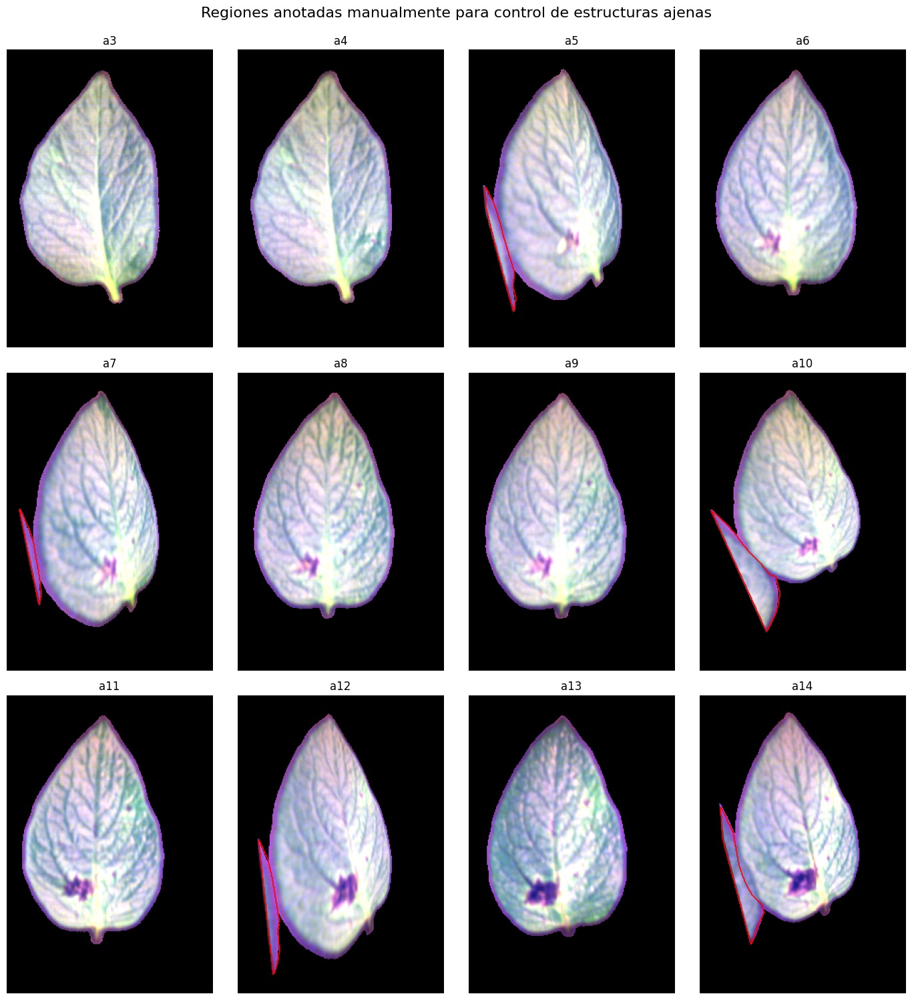

In [ ]:
# Celda 31 - Superponer las regiones anotadas manualmente sobre la secuencia

fig, axes = plt.subplots(3, 4, figsize=(14, 15))
axes = axes.ravel()

for ax, dia in zip(axes, dias):
    pseudo_rgb = crear_pseudorgb(
        cubos_procesados[dia],
        secuencia[dia]['wavelengths']
    )

    ax.imshow(pseudo_rgb)

    mask = mascaras_anotadas[dia]
    if mask.any():
        ax.contour(mask, levels=[0.5], colors='red', linewidths=1.2)

    ax.set_title(f'a{dia}')
    ax.axis('off')

plt.suptitle(
    'Regiones anotadas manualmente para control de estructuras ajenas',
    fontsize=16, y=0.995
)

plt.tight_layout()
plt.show()

### 4.7 Construcción de las regiones de interés (ROI)

La segmentación automática permite separar adecuadamente el tejido vegetal del
fondo, pero no distingue estructuras foliares que se encuentran en contacto.

Las anotaciones manuales identifican específicamente las regiones correspondientes
a estructuras ajenas u ocluyentes.

Por tanto, para los experimentos de registro se construye una región de interés
combinando ambas fuentes:

$ M_{ROI}=M_{tejido}\land\neg M_{anotada} $

Esta estrategia conserva el tejido observado del foliolo objetivo y excluye las
regiones identificadas como potencialmente interferentes durante el registro.

In [ ]:
# Celda 32 - Construir la ROI y eliminar componentes residuales desconectados

def conservar_componente_principal(mask):
    labels, n = ndimage.label(mask)

    if n == 0:
        return mask

    sizes = ndimage.sum(mask, labels, range(1, n + 1))
    principal = np.argmax(sizes) + 1

    return labels == principal

mascaras_roi = {}

for dia in dias:
    mascara_tejido = mascaras[dia]
    mascara_exclusion = mascaras_anotadas[dia]

    # Excluir regiones anotadas manualmente
    roi_inicial = mascara_tejido & ~mascara_exclusion

    # Conservar únicamente el componente conexo correspondiente al foliolo objetivo
    mascaras_roi[dia] = conservar_componente_principal(roi_inicial)

    eliminados = roi_inicial.sum() - mascaras_roi[dia].sum()

    print(
        f'a{dia:02d} | tejido={mascara_tejido.sum():5d} | '
        f'exclusión={mascara_exclusion.sum():4d} | '
        f'residuales={eliminados:4d} | ROI={mascaras_roi[dia].sum():5d}'
    )

a03 | tejido=26734 | exclusión=   0 | residuales=   0 | ROI=26734
a04 | tejido=26969 | exclusión=   0 | residuales=   0 | ROI=26969
a05 | tejido=26301 | exclusión=1274 | residuales= 264 | ROI=24795
a06 | tejido=26554 | exclusión=   0 | residuales=   0 | ROI=26554
a07 | tejido=25849 | exclusión= 617 | residuales= 137 | ROI=25127
a08 | tejido=26769 | exclusión=   0 | residuales=   0 | ROI=26769
a09 | tejido=26713 | exclusión=   0 | residuales=   0 | ROI=26713
a10 | tejido=23412 | exclusión=2783 | residuales= 246 | ROI=20442
a11 | tejido=26694 | exclusión=   0 | residuales=   0 | ROI=26694
a12 | tejido=26990 | exclusión=1330 | residuales= 293 | ROI=25421
a13 | tejido=26826 | exclusión=   0 | residuales=   0 | ROI=26826
a14 | tejido=23850 | exclusión=1814 | residuales= 159 | ROI=21883


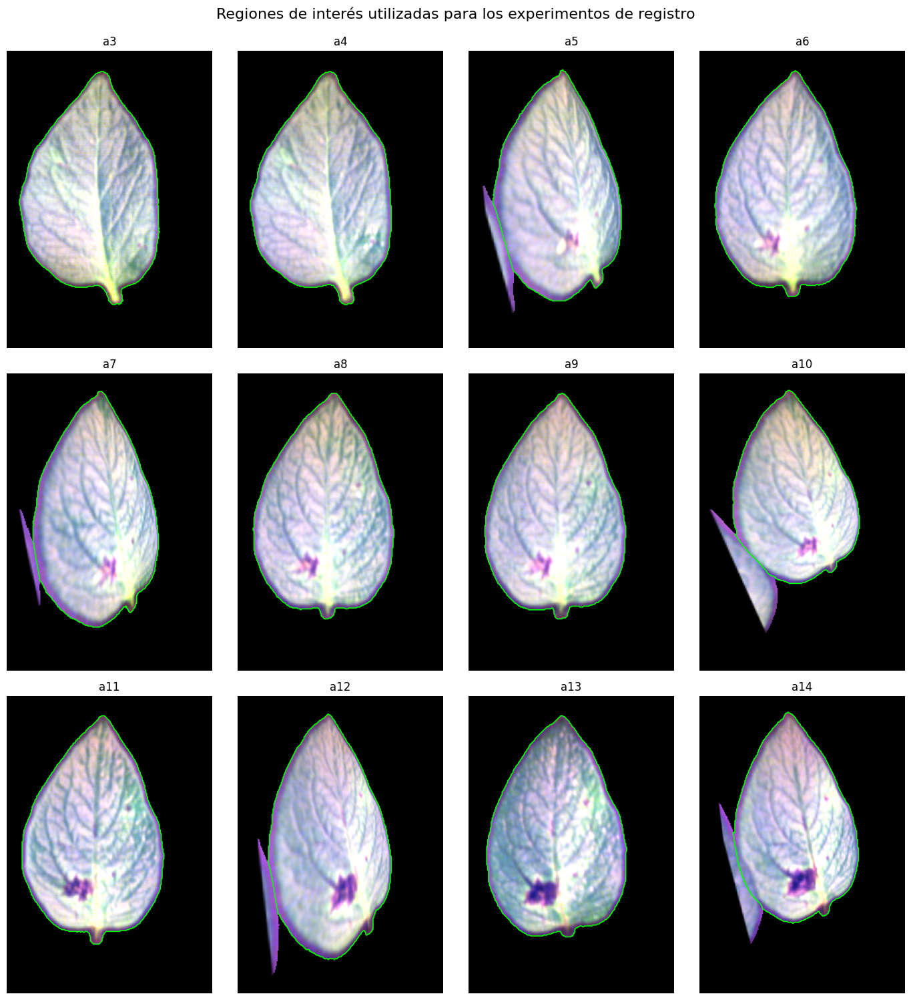

In [ ]:
# Celda 33 - Verificar las regiones de interés finales de toda la secuencia

fig, axes = plt.subplots(3, 4, figsize=(14, 15))
axes = axes.ravel()

for ax, dia in zip(axes, dias):
    pseudo_rgb = crear_pseudorgb(
        cubos_procesados[dia],
        secuencia[dia]['wavelengths']
    )

    ax.imshow(pseudo_rgb)
    ax.contour(mascaras_roi[dia], levels=[0.5], colors='lime', linewidths=1.2)

    ax.set_title(f'a{dia}')
    ax.axis('off')

plt.suptitle(
    'Regiones de interés utilizadas para los experimentos de registro',
    fontsize=16, y=0.995
)

plt.tight_layout()
plt.show()

## 5. Construcción de representaciones HSI para registro temporal

Un cubo hiperespectral contiene múltiples representaciones potenciales de una misma
estructura espacial. Sin embargo, las diferentes regiones espectrales no necesariamente
proporcionan la misma información para establecer correspondencias entre adquisiciones
temporales.

En esta etapa se exploran diferentes representaciones bidimensionales derivadas de
los cubos HSI, buscando identificar información espacial persistente y discriminativa
que pueda favorecer el registro temporal.

Inicialmente se consideran representaciones del espectro visible, infrarrojo cercano
(NIR) y componentes obtenidos mediante análisis de componentes principales (PCA).
Posteriormente se evaluarán representaciones orientadas a resaltar información
estructural.

In [ ]:
# Celda 34 - Seleccionar bandas representativas de diferentes regiones espectrales

longitudes_objetivo = [450, 550, 650, 750, 800, 850, 900, 950]

bandas_seleccionadas = {}

for objetivo in longitudes_objetivo:
    idx, wl = banda_mas_cercana(wavelengths, objetivo)
    bandas_seleccionadas[objetivo] = (idx, wl)
    print(f'{objetivo:3d} nm → banda {idx:3d} | {wl:.2f} nm')

450 nm → banda   9 | 448.84 nm
550 nm → banda  28 | 549.58 nm
650 nm → banda  47 | 651.64 nm
750 nm → banda  65 | 749.56 nm
800 nm → banda  74 | 798.97 nm
850 nm → banda  83 | 848.67 nm
900 nm → banda  92 | 898.67 nm
950 nm → banda 101 | 948.98 nm


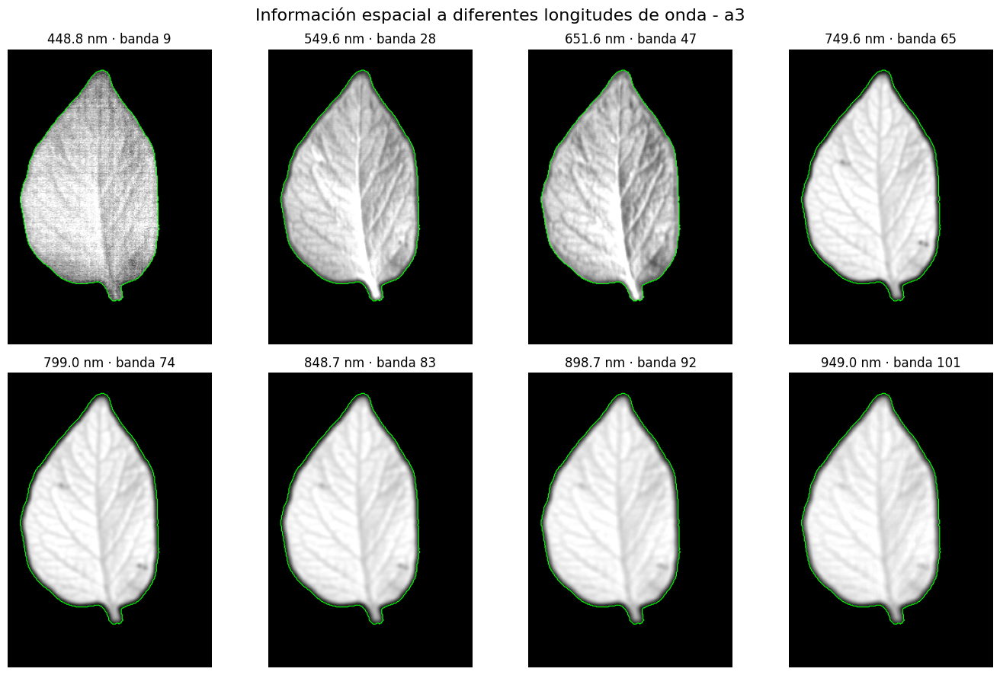

In [ ]:
# Celda 35 - Comparar visualmente bandas VIS-NIR de la adquisición de referencia a3

dia_ref = 3
cube_ref = cubos_procesados[dia_ref]
roi_ref = mascaras_roi[dia_ref]

fig, axes = plt.subplots(2, 4, figsize=(14, 9))
axes = axes.ravel()

for ax, objetivo in zip(axes, longitudes_objetivo):
    idx, wl = bandas_seleccionadas[objetivo]

    banda = cube_ref[:, :, idx].copy()
    banda_norm = normalizar_banda(banda)

    ax.imshow(banda_norm, cmap='gray')
    ax.contour(roi_ref, levels=[0.5], colors='lime', linewidths=0.8)
    ax.set_title(f'{wl:.1f} nm · banda {idx}')
    ax.axis('off')

plt.suptitle(
    f'Información espacial a diferentes longitudes de onda - a{dia_ref}',
    fontsize=16, y=0.98
)

plt.tight_layout()
plt.show()

### 5.1 Representaciones mediante análisis de componentes principales

La selección de una única banda espectral utiliza solamente una fracción de la
información contenida en el cubo HSI.

Como alternativa, se aplica análisis de componentes principales (PCA) para obtener
representaciones bidimensionales que integren información procedente de múltiples
bandas espectrales.

El PCA se ajusta utilizando únicamente los píxeles pertenecientes a la región de
interés, evitando que el fondo y las estructuras ajenas influyan en la estimación
de los componentes principales.

In [ ]:
# Celda 36 - Ajustar PCA sobre los espectros válidos de la adquisición a3

from sklearn.decomposition import PCA

dia_pca = 3
cube_pca = cubos_procesados[dia_pca]
roi_pca = mascaras_roi[dia_pca]

# Extraer únicamente espectros pertenecientes a la ROI
X = cube_pca[roi_pca]

print('Espectros utilizados:', X.shape)

pca = PCA(n_components=5)
pca.fit(X)

print('\nVarianza explicada:')
for i, var in enumerate(pca.explained_variance_ratio_, start=1):
    print(f'PC{i}: {100 * var:.4f}%')

print(f'\nAcumulada PC1-PC5: {100 * pca.explained_variance_ratio_.sum():.4f}%')

Espectros utilizados: (26734, 111)

Varianza explicada:
PC1: 97.6530%
PC2: 1.0112%
PC3: 0.6675%
PC4: 0.1971%
PC5: 0.0814%

Acumulada PC1-PC5: 99.6102%


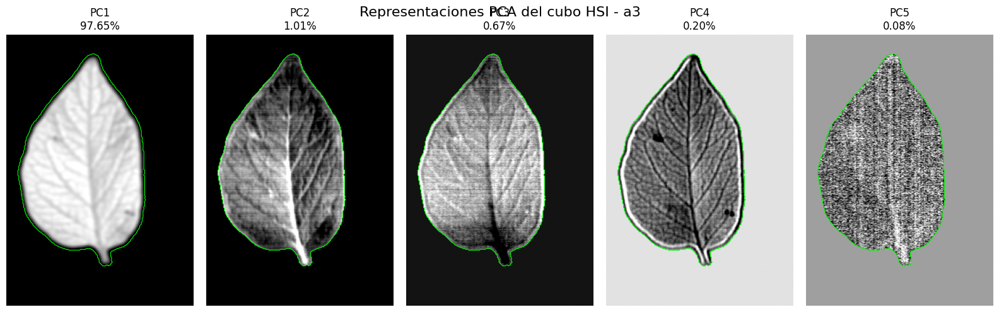

In [ ]:
# Celda 37 - Construir y visualizar las primeras cinco componentes principales

H, W, B = cube_pca.shape
cube_flat = cube_pca.reshape(-1, B)

# Evitar problemas si existiera algún valor no finito
cube_flat = np.nan_to_num(cube_flat, nan=0.0, posinf=0.0, neginf=0.0)

proyeccion = pca.transform(cube_flat).reshape(H, W, 5)

fig, axes = plt.subplots(1, 5, figsize=(16, 5))

for i, ax in enumerate(axes):
    pc = proyeccion[:, :, i]

    # Normalización calculada únicamente sobre la ROI
    valores_roi = pc[roi_pca]
    lo, hi = np.percentile(valores_roi, [2, 98])

    pc_norm = np.clip((pc - lo) / (hi - lo), 0, 1)

    ax.imshow(pc_norm, cmap='gray')
    ax.contour(roi_pca, levels=[0.5], colors='lime', linewidths=0.8)
    ax.set_title(
        f'PC{i + 1}\n'
        f'{100 * pca.explained_variance_ratio_[i]:.2f}%'
    )
    ax.axis('off')

plt.suptitle(
    f'Representaciones PCA del cubo HSI - a{dia_pca}',
    fontsize=16
)

plt.tight_layout()
plt.show()

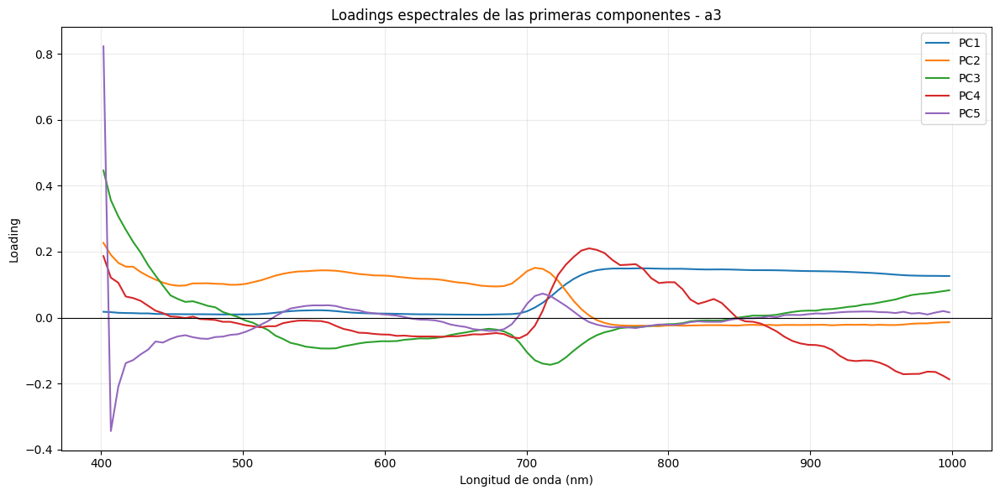

In [ ]:
# Celda 38 - Analizar la contribución espectral de cada banda a las componentes PCA

fig, ax = plt.subplots(figsize=(12, 6))

for i in range(5):
    ax.plot(
        wavelengths,
        pca.components_[i],
        label=f'PC{i + 1}'
    )

ax.axhline(0, linewidth=0.8, color='black')
ax.set_xlabel('Longitud de onda (nm)')
ax.set_ylabel('Loading')
ax.set_title('Loadings espectrales de las primeras componentes - a3')
ax.legend()
ax.grid(alpha=0.25)

plt.tight_layout()
plt.show()

### 5.2 PCA común para la secuencia temporal

El cálculo independiente de PCA para cada adquisición no garantiza que componentes
con el mismo índice representen las mismas combinaciones espectrales.

Para obtener una representación comparable entre instantes, se construye una base PCA
común utilizando los espectros pertenecientes a las regiones de interés de todas las
adquisiciones temporales.

La misma transformación espectral se aplica posteriormente a cada cubo HSI, de manera
que una componente determinada conserve el mismo significado espectral a lo largo de
toda la secuencia.

In [ ]:
# Celda 39 - Construir el conjunto de espectros válidos de toda la secuencia temporal

X_temporal = []
resumen_espectros = {}

for dia in dias:
    cube_dia = cubos_procesados[dia]
    roi_dia = mascaras_roi[dia]

    X_dia = cube_dia[roi_dia]
    X_temporal.append(X_dia)
    resumen_espectros[dia] = len(X_dia)

    print(f'a{dia:02d} | espectros={len(X_dia):5d} | bandas={X_dia.shape[1]}')

X_comun = np.vstack(X_temporal)

print('\nMatriz espectral común:')
print('Shape:', X_comun.shape)
print('Espectros totales:', X_comun.shape[0])
print('Bandas:', X_comun.shape[1])
print('NaN:', np.isnan(X_comun).sum())
print('Inf:', np.isinf(X_comun).sum())

a03 | espectros=26734 | bandas=111
a04 | espectros=26969 | bandas=111
a05 | espectros=24795 | bandas=111
a06 | espectros=26554 | bandas=111
a07 | espectros=25127 | bandas=111
a08 | espectros=26769 | bandas=111
a09 | espectros=26713 | bandas=111
a10 | espectros=20442 | bandas=111
a11 | espectros=26694 | bandas=111
a12 | espectros=25421 | bandas=111
a13 | espectros=26826 | bandas=111
a14 | espectros=21883 | bandas=111

Matriz espectral común:
Shape: (304927, 111)
Espectros totales: 304927
Bandas: 111
NaN: 0
Inf: 0


In [ ]:
# Celda 40 - Ajustar una única base PCA utilizando toda la secuencia temporal

from sklearn.decomposition import PCA

pca_comun = PCA(n_components=5)
pca_comun.fit(X_comun)

print('Varianza explicada por el PCA común:\n')

for i, var in enumerate(pca_comun.explained_variance_ratio_, start=1):
    print(f'PC{i}: {100 * var:.4f}%')

print(f'\nAcumulada PC1-PC5: {100 * pca_comun.explained_variance_ratio_.sum():.4f}%')

Varianza explicada por el PCA común:

PC1: 97.5451%
PC2: 1.3688%
PC3: 0.5529%
PC4: 0.2235%
PC5: 0.1232%

Acumulada PC1-PC5: 99.8135%


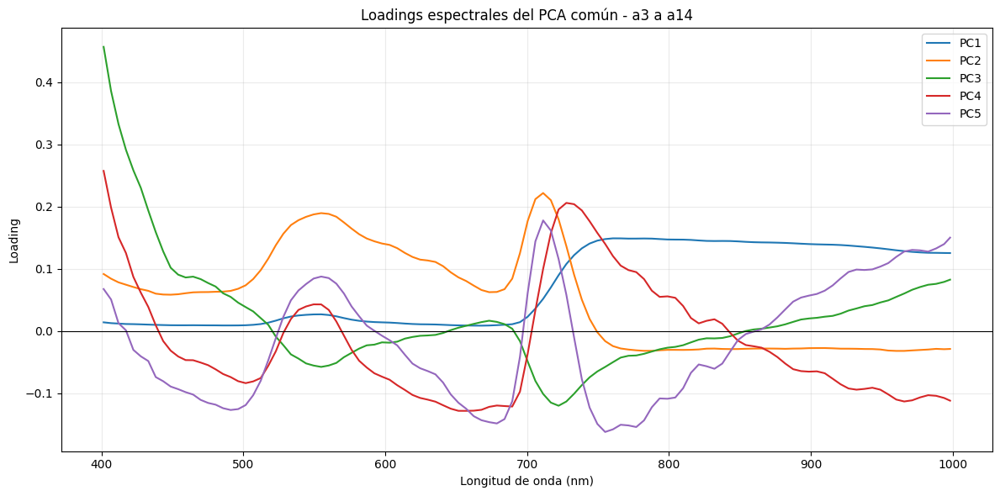

In [ ]:
# Celda 41 - Visualizar los loadings espectrales de la base PCA común

fig, ax = plt.subplots(figsize=(12, 6))

for i in range(5):
    ax.plot(
        wavelengths,
        pca_comun.components_[i],
        label=f'PC{i + 1}'
    )

ax.axhline(0, linewidth=0.8, color='black')
ax.set_xlabel('Longitud de onda (nm)')
ax.set_ylabel('Loading')
ax.set_title('Loadings espectrales del PCA común - a3 a a14')
ax.legend()
ax.grid(alpha=0.25)

plt.tight_layout()
plt.show()

In [ ]:
# Celda 42 - Proyectar todos los cubos HSI sobre la misma base PCA común

pca_temporal = {}

for dia in dias:
    cube_dia = cubos_procesados[dia]
    H, W, B = cube_dia.shape

    X_dia = cube_dia.reshape(-1, B)
    X_dia = np.nan_to_num(X_dia, nan=0.0, posinf=0.0, neginf=0.0)

    proyeccion = pca_comun.transform(X_dia).reshape(H, W, 5)

    pca_temporal[dia] = proyeccion

    print(f'a{dia:02d} | shape={proyeccion.shape}')

a03 | shape=(327, 226, 5)
a04 | shape=(327, 226, 5)
a05 | shape=(327, 226, 5)
a06 | shape=(327, 226, 5)
a07 | shape=(327, 226, 5)
a08 | shape=(327, 226, 5)
a09 | shape=(327, 226, 5)
a10 | shape=(327, 226, 5)
a11 | shape=(327, 226, 5)
a12 | shape=(327, 226, 5)
a13 | shape=(327, 226, 5)
a14 | shape=(327, 226, 5)


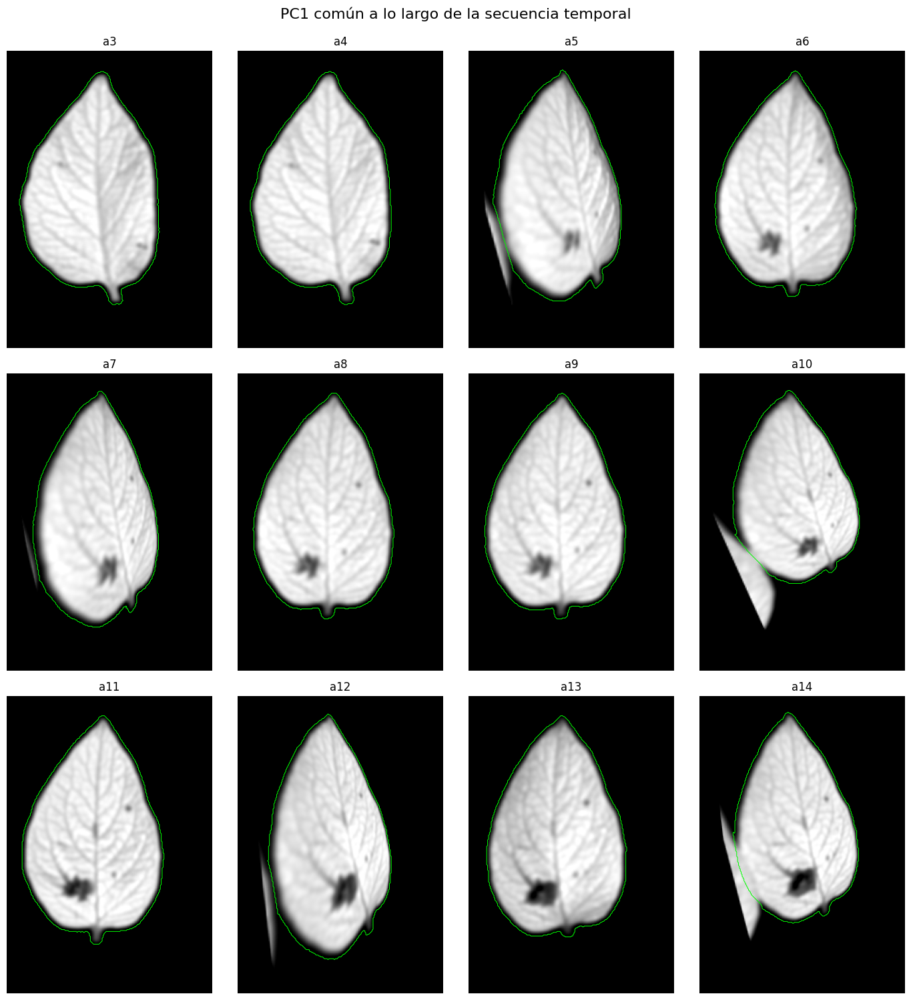

In [ ]:
# Celda 43 - Visualizar PC1 común a lo largo de toda la secuencia temporal

componente = 0  # PC1

fig, axes = plt.subplots(3, 4, figsize=(14, 15))
axes = axes.ravel()

for ax, dia in zip(axes, dias):
    pc = pca_temporal[dia][:, :, componente]
    roi = mascaras_roi[dia]

    lo, hi = np.percentile(pc[roi], [2, 98])
    pc_norm = np.clip((pc - lo) / (hi - lo), 0, 1)

    ax.imshow(pc_norm, cmap='gray')
    ax.contour(roi, levels=[0.5], colors='lime', linewidths=0.7)
    ax.set_title(f'a{dia}')
    ax.axis('off')

plt.suptitle(
    f'PC{componente + 1} común a lo largo de la secuencia temporal',
    fontsize=16, y=0.995
)

plt.tight_layout()
plt.show()

In [ ]:
# Celda 44 - Función para visualizar cualquier componente PCA en toda la secuencia

def visualizar_pc_temporal(componente):
    fig, axes = plt.subplots(3, 4, figsize=(14, 15))
    axes = axes.ravel()

    for ax, dia in zip(axes, dias):
        pc = pca_temporal[dia][:, :, componente]
        roi = mascaras_roi[dia]

        lo, hi = np.percentile(pc[roi], [2, 98])
        pc_norm = np.clip((pc - lo) / (hi - lo), 0, 1)

        ax.imshow(pc_norm, cmap='gray')
        ax.contour(roi, levels=[0.5], colors='lime', linewidths=0.7)
        ax.set_title(f'a{dia}')
        ax.axis('off')

    plt.suptitle(
        f'PC{componente + 1} común a lo largo de la secuencia temporal',
        fontsize=16, y=0.995
    )

    plt.tight_layout()
    plt.show()

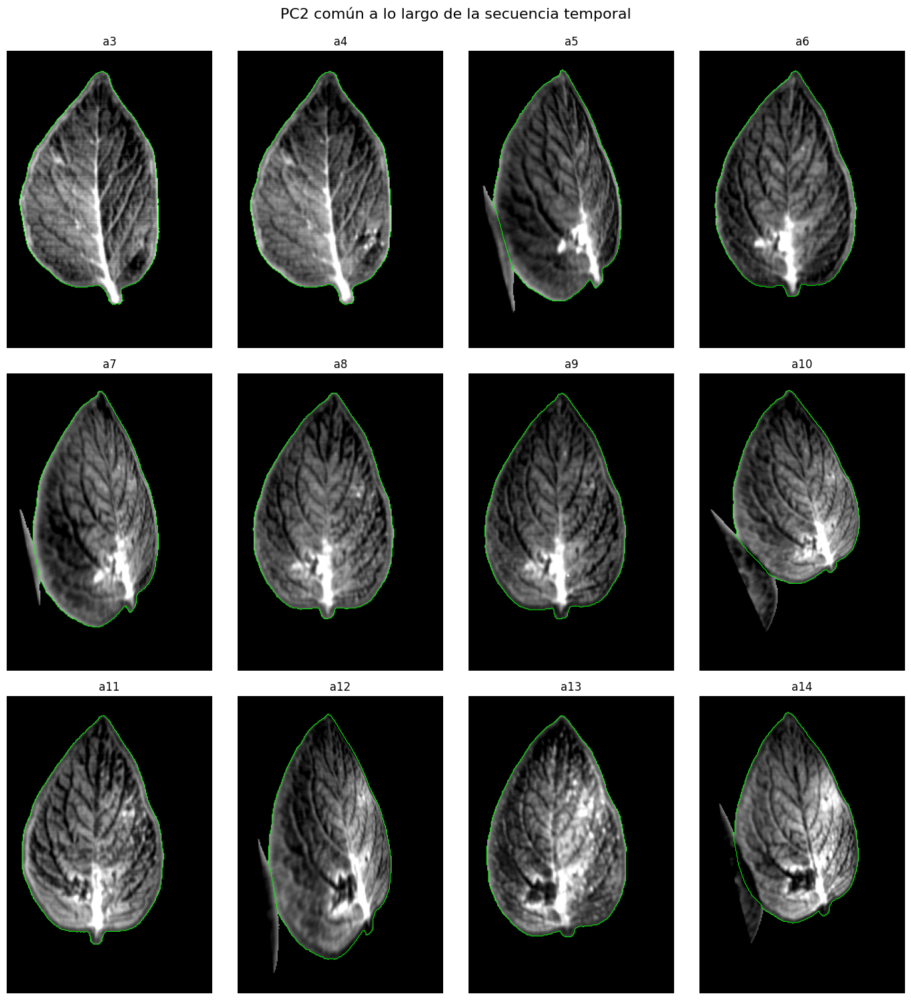

In [ ]:
# Celda 45 - Visualizar PC2 común a lo largo de la secuencia temporal
visualizar_pc_temporal(1)

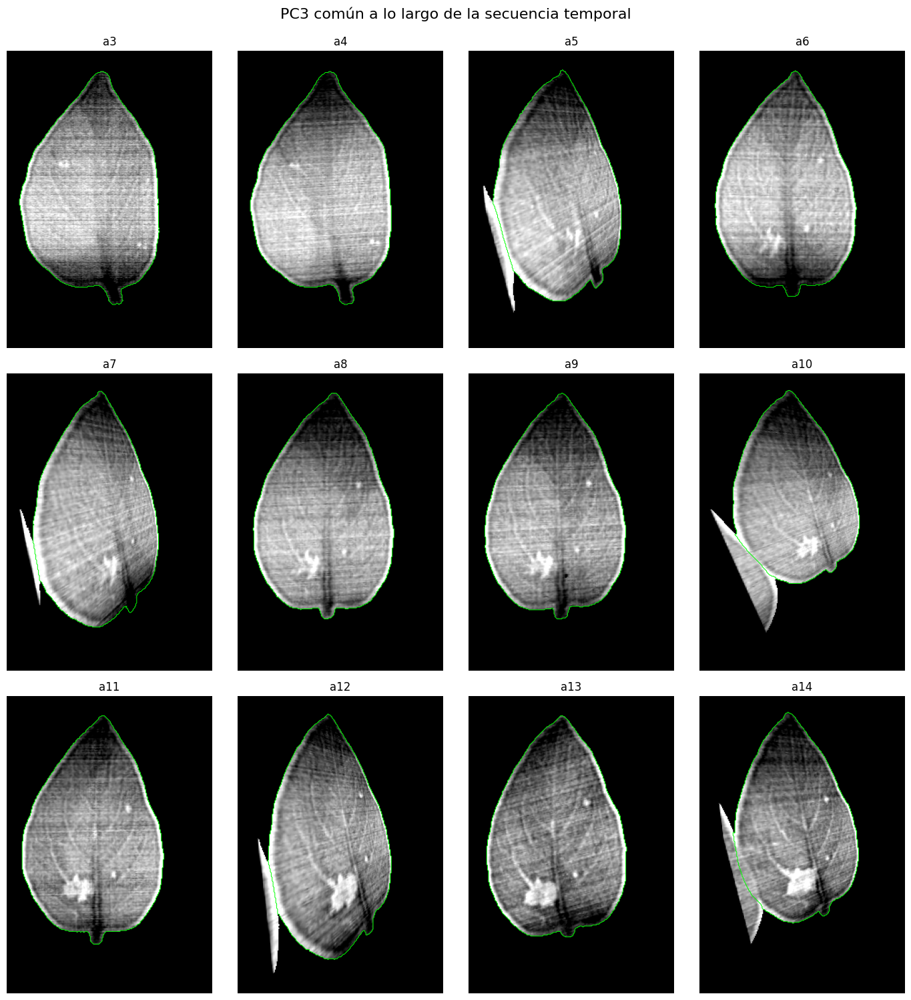

In [ ]:
# Celda 46 - Visualizar PC3 común a lo largo de la secuencia temporal
visualizar_pc_temporal(2)

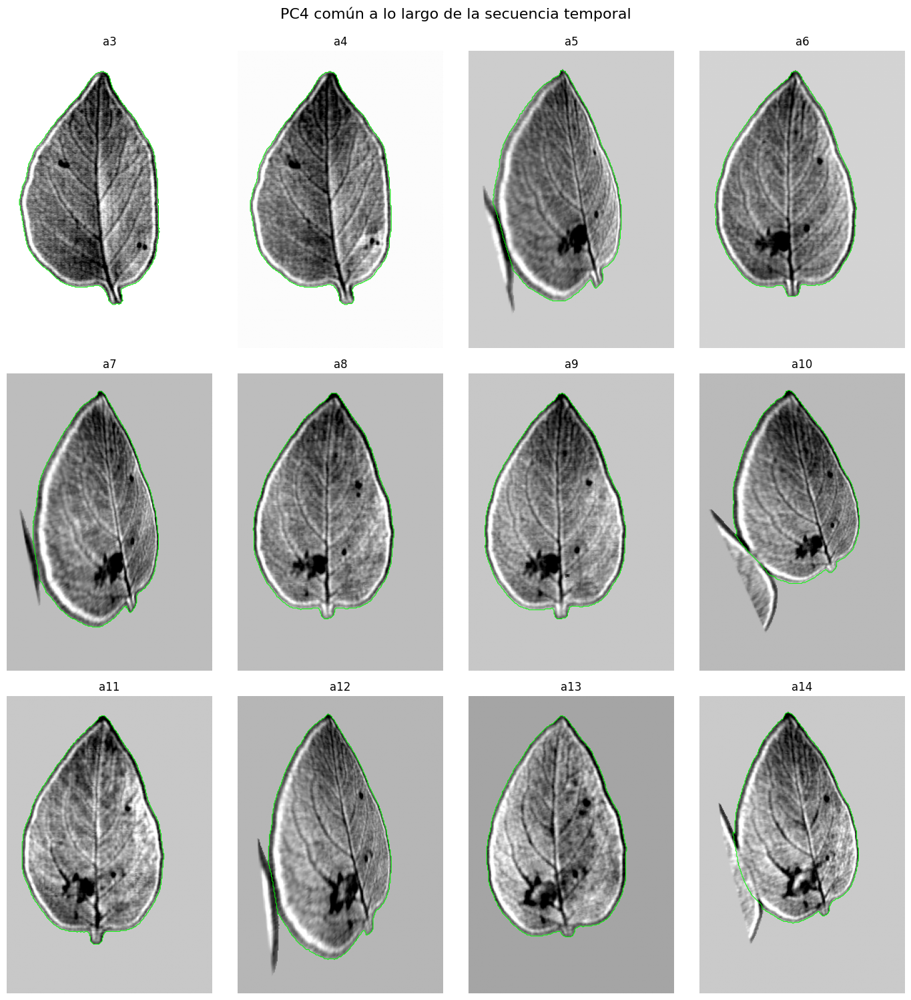

In [ ]:
# Celda 47 - Visualizar PC4 común a lo largo de la secuencia temporal
visualizar_pc_temporal(3)

In [ ]:
# Celda 48 - Construir una representación multicanal de falso color usando PC1, PC2 y PC4

def normalizar_pc_roi(pc, roi, p_low=2, p_high=98):
    valores = pc[roi]
    lo, hi = np.percentile(valores, [p_low, p_high])

    if hi <= lo:
        return np.zeros_like(pc, dtype=np.float32)

    pc_norm = (pc - lo) / (hi - lo)
    return np.clip(pc_norm, 0, 1).astype(np.float32)


def crear_pca_multicanal(proyeccion, roi):
    pc1 = normalizar_pc_roi(proyeccion[:, :, 0], roi)
    pc2 = normalizar_pc_roi(proyeccion[:, :, 1], roi)
    pc4 = normalizar_pc_roi(proyeccion[:, :, 3], roi)

    multicanal = np.dstack([pc1, pc2, pc4])

    # Fondo negro únicamente para visualización
    multicanal[~roi] = 0

    return multicanal

In [ ]:
# Celda 49 - Generar la representación PCA multicanal para cada adquisición

pca_multicanal = {}

for dia in dias:
    pca_multicanal[dia] = crear_pca_multicanal(
        pca_temporal[dia],
        mascaras_roi[dia]
    )

    print(
        f'a{dia:02d} | shape={pca_multicanal[dia].shape} | '
        f'min={pca_multicanal[dia].min():.3f} | '
        f'max={pca_multicanal[dia].max():.3f}'
    )

a03 | shape=(327, 226, 3) | min=0.000 | max=1.000
a04 | shape=(327, 226, 3) | min=0.000 | max=1.000
a05 | shape=(327, 226, 3) | min=0.000 | max=1.000
a06 | shape=(327, 226, 3) | min=0.000 | max=1.000
a07 | shape=(327, 226, 3) | min=0.000 | max=1.000
a08 | shape=(327, 226, 3) | min=0.000 | max=1.000
a09 | shape=(327, 226, 3) | min=0.000 | max=1.000
a10 | shape=(327, 226, 3) | min=0.000 | max=1.000
a11 | shape=(327, 226, 3) | min=0.000 | max=1.000
a12 | shape=(327, 226, 3) | min=0.000 | max=1.000
a13 | shape=(327, 226, 3) | min=0.000 | max=1.000
a14 | shape=(327, 226, 3) | min=0.000 | max=1.000


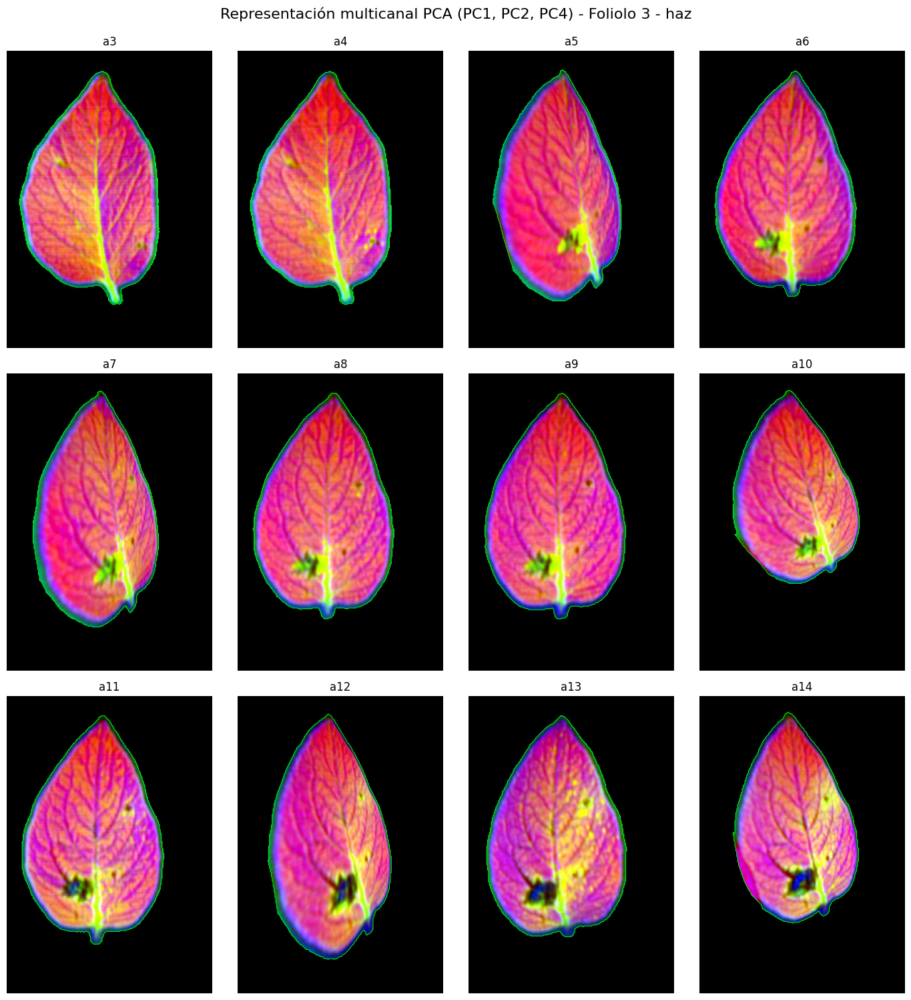

In [ ]:
# Celda 50 - Visualizar la representación multicanal PCA a lo largo de toda la secuencia

fig, axes = plt.subplots(3, 4, figsize=(14, 15))
axes = axes.ravel()

for ax, dia in zip(axes, dias):
    ax.imshow(pca_multicanal[dia])

    ax.contour(
        mascaras_roi[dia],
        levels=[0.5],
        colors='lime',
        linewidths=0.7
    )

    ax.set_title(f'a{dia}')
    ax.axis('off')

plt.suptitle(
    'Representación multicanal PCA (PC1, PC2, PC4) - Foliolo 3 - haz',
    fontsize=16,
    y=0.995
)

plt.tight_layout()
plt.show()

In [ ]:
# Celda 51 - Calcular límites comunes para normalizar PC1, PC2 y PC4

componentes = [0, 1, 3]
limites_pca = {}

for componente in componentes:
    valores = np.concatenate([
        pca_temporal[dia][:, :, componente][mascaras_roi[dia]]
        for dia in dias
    ])

    lo, hi = np.percentile(valores, [2, 98])
    limites_pca[componente] = (lo, hi)

    print(
        f'PC{componente + 1} | '
        f'P2={lo:.4f} | P98={hi:.4f} | '
        f'valores={len(valores)}'
    )

PC1 | P2=-2.6765 | P98=0.7589 | valores=304927
PC2 | P2=-0.1660 | P98=0.2773 | valores=304927
PC4 | P2=-0.0856 | P98=0.0886 | valores=304927


In [ ]:
# Celda 52 - Crear las composiciones multicanal con normalización temporal común

def crear_pca_multicanal_comun(proyeccion, roi, limites):
    canales = []

    for componente in [0, 1, 3]:
        pc = proyeccion[:, :, componente]
        lo, hi = limites[componente]

        pc_norm = np.clip((pc - lo) / (hi - lo), 0, 1)
        canales.append(pc_norm)

    multicanal = np.dstack(canales).astype(np.float32)
    multicanal[~roi] = 0

    return multicanal


pca_multicanal_comun = {}

for dia in dias:
    pca_multicanal_comun[dia] = crear_pca_multicanal_comun(
        pca_temporal[dia],
        mascaras_roi[dia],
        limites_pca
    )

    print(f'a{dia:02d} | shape={pca_multicanal_comun[dia].shape}')

a03 | shape=(327, 226, 3)
a04 | shape=(327, 226, 3)
a05 | shape=(327, 226, 3)
a06 | shape=(327, 226, 3)
a07 | shape=(327, 226, 3)
a08 | shape=(327, 226, 3)
a09 | shape=(327, 226, 3)
a10 | shape=(327, 226, 3)
a11 | shape=(327, 226, 3)
a12 | shape=(327, 226, 3)
a13 | shape=(327, 226, 3)
a14 | shape=(327, 226, 3)


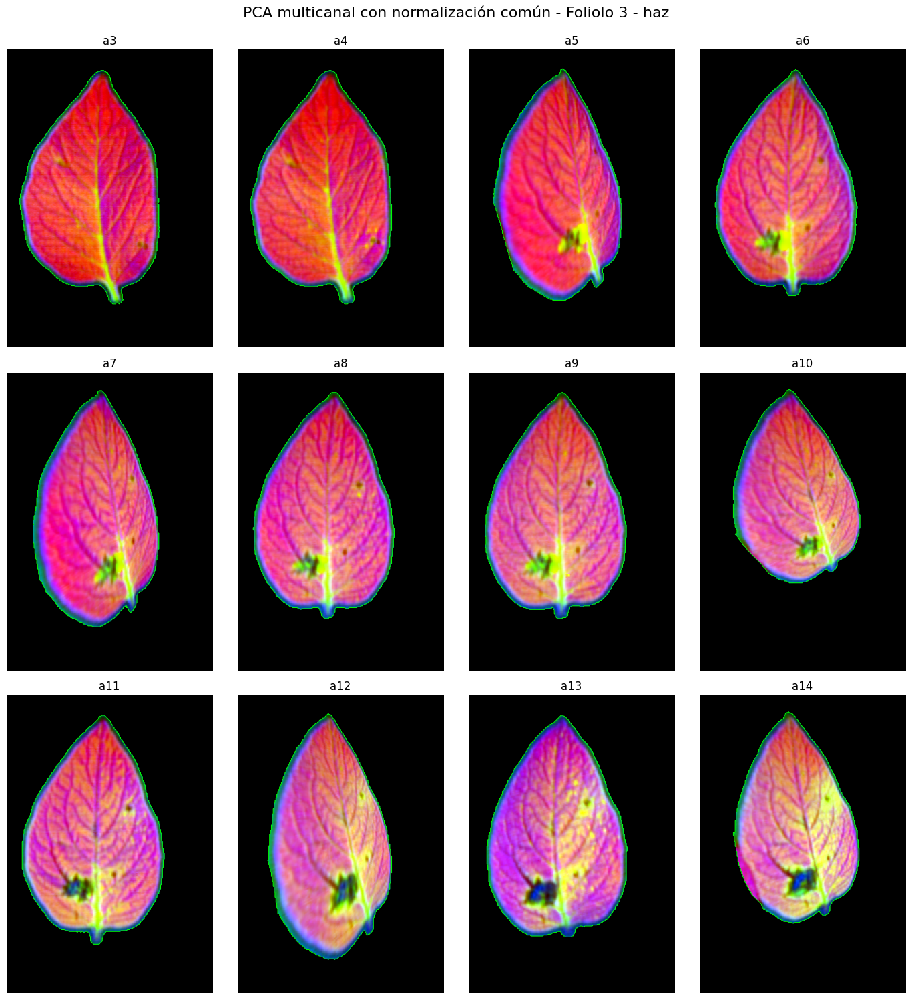

In [ ]:
# Celda 53 - Visualizar la secuencia PCA multicanal con normalización común

fig, axes = plt.subplots(3, 4, figsize=(14, 15))
axes = axes.ravel()

for ax, dia in zip(axes, dias):
    ax.imshow(pca_multicanal_comun[dia])

    ax.contour(
        mascaras_roi[dia],
        levels=[0.5],
        colors='lime',
        linewidths=0.7
    )

    ax.set_title(f'a{dia}')
    ax.axis('off')

plt.suptitle(
    'PCA multicanal con normalización común - Foliolo 3 - haz',
    fontsize=16,
    y=0.995
)

plt.tight_layout()
plt.show()


# Etapa 2. Registro temporal de imágenes HSI

## 2.1. Registro rígido entre adquisiciones consecutivas

**Objetivo:** Explorar el establecimiento de correspondencias espaciales entre dos adquisiciones temporales de una misma estructura foliar.

Se utilizarán las adquisiciones a3 y a4 del foliolo 3, haz, y las representaciones multicanal obtenidas mediante el PCA común (PC1, PC2 y PC4).

Inicialmente se evaluará la desalineación espacial de ambas adquisiciones antes de aplicar transformaciones geométricas.

Posteriormente se explorarán estrategias de registro rígido, afín y deformable.

In [ ]:

# Celda 54 - Identificar las variables disponibles para el registro temporal

import numpy as np

print("Variables disponibles relacionadas con PCA y máscaras:\n")

for nombre, valor in globals().copy().items():
    if any(texto in nombre.lower() for texto in ['pca', 'roi', 'mask', 'multi']):
        if isinstance(valor, np.ndarray):
            print(f'{nombre:35s} | ndarray | shape={valor.shape}')
        elif isinstance(valor, dict):
            print(f'{nombre:35s} | dict | claves={list(valor.keys())[:5]}')
        else:
            print(f'{nombre:35s} | {type(valor).__name__}')

Variables disponibles relacionadas con PCA y máscaras:

mask_nan                            | ndarray | shape=(327, 226, 111)
MASK_ROOT                           | PosixPath
mask                                | ndarray | shape=(327, 226)
mascaras_roi                        | dict | claves=[3, 4, 5, 6, 7]
roi_inicial                         | ndarray | shape=(327, 226)
roi_ref                             | ndarray | shape=(327, 226)
PCA                                 | ABCMeta
dia_pca                             | int
cube_pca                            | ndarray | shape=(327, 226, 111)
roi_pca                             | ndarray | shape=(327, 226)
pca                                 | PCA
valores_roi                         | ndarray | shape=(26734,)
roi_dia                             | ndarray | shape=(327, 226)
pca_comun                           | PCA
pca_temporal                        | dict | claves=[3, 4, 5, 6, 7]
roi                                 | ndarray | shape=(327, 

In [ ]:

# Celda 55 - Preparar el primer par temporal para el registro

DIA_FIJO = 3
DIA_MOVIL = 4

# Representaciones multicanal PCA normalizadas
img_fija = np.asarray(pca_multicanal_comun[DIA_FIJO], dtype=np.float32)
img_movil = np.asarray(pca_multicanal_comun[DIA_MOVIL], dtype=np.float32)

# Proyecciones originales del PCA común
pca_fija = np.asarray(pca_temporal[DIA_FIJO], dtype=np.float32)
pca_movil = np.asarray(pca_temporal[DIA_MOVIL], dtype=np.float32)

# Máscaras de las regiones de interés
mask_fija = np.asarray(mascaras_roi[DIA_FIJO], dtype=bool)
mask_movil = np.asarray(mascaras_roi[DIA_MOVIL], dtype=bool)

# Verificar consistencia espacial
assert img_fija.shape == img_movil.shape
assert mask_fija.shape == mask_movil.shape == img_fija.shape[:2]
assert pca_fija.shape[:2] == pca_movil.shape[:2] == mask_fija.shape

print(f'Imagen fija:  a{DIA_FIJO}')
print(f'Imagen móvil: a{DIA_MOVIL}')

print('\nRepresentaciones multicanal:')
print('Fija: ', img_fija.shape)
print('Móvil:', img_movil.shape)

print('\nProyecciones PCA originales:')
print('Fija: ', pca_fija.shape)
print('Móvil:', pca_movil.shape)

print('\nRegiones de interés:')
print(f'Fija:  {mask_fija.sum()} píxeles')
print(f'Móvil: {mask_movil.sum()} píxeles')

print('\nVerificación completada.')

Imagen fija:  a3
Imagen móvil: a4

Representaciones multicanal:
Fija:  (327, 226, 3)
Móvil: (327, 226, 3)

Proyecciones PCA originales:
Fija:  (327, 226, 5)
Móvil: (327, 226, 5)

Regiones de interés:
Fija:  26734 píxeles
Móvil: 26969 píxeles

Verificación completada.


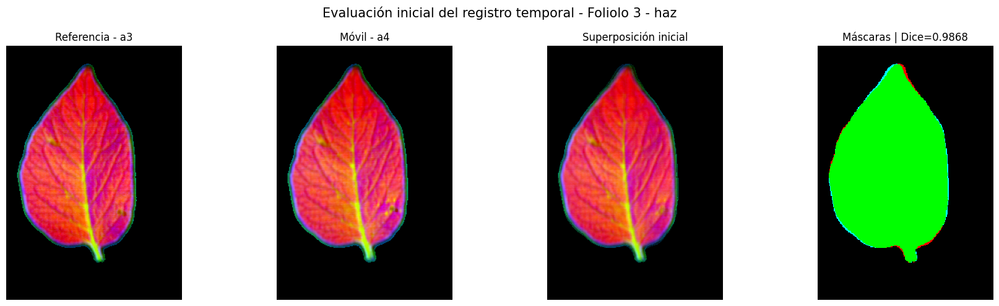

Evaluación inicial a3 ↔ a4
---------------------------------------------
Píxeles referencia:  26734
Píxeles móvil:       26969
Intersección:        26498
Unión:               27205
Dice inicial:        0.986835
IoU inicial:         0.974012


In [ ]:

# Celda 56 - Visualizar y cuantificar la desalineación inicial entre a3 y a4

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Calcular intersección y unión de las máscaras
interseccion = np.logical_and(mask_fija, mask_movil).sum()
union = np.logical_or(mask_fija, mask_movil).sum()

dice_inicial = 2 * interseccion / (mask_fija.sum() + mask_movil.sum())
iou_inicial = interseccion / union

# Superposición de imágenes multicanal
superposicion = 0.5 * img_fija + 0.5 * img_movil

# Clasificación espacial de las máscaras
comparacion = np.zeros(mask_fija.shape, dtype=np.uint8)
comparacion[mask_fija & ~mask_movil] = 1
comparacion[~mask_fija & mask_movil] = 2
comparacion[mask_fija & mask_movil] = 3

colores = ListedColormap(['black', 'red', 'cyan', 'lime'])

# Visualización
fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(img_fija)
axes[0].set_title('Referencia - a3')

axes[1].imshow(img_movil)
axes[1].set_title('Móvil - a4')

axes[2].imshow(superposicion)
axes[2].set_title('Superposición inicial')

axes[3].imshow(comparacion, cmap=colores, vmin=0, vmax=3, interpolation='nearest')
axes[3].set_title(f'Máscaras | Dice={dice_inicial:.4f}')

for ax in axes:
    ax.axis('off')

plt.suptitle('Evaluación inicial del registro temporal - Foliolo 3 - haz', fontsize=15)
plt.tight_layout()
plt.show()

# Resultados cuantitativos
print('Evaluación inicial a3 ↔ a4')
print('-' * 45)
print(f'Píxeles referencia:  {mask_fija.sum()}')
print(f'Píxeles móvil:       {mask_movil.sum()}')
print(f'Intersección:        {interseccion}')
print(f'Unión:               {union}')
print(f'Dice inicial:        {dice_inicial:.6f}')
print(f'IoU inicial:         {iou_inicial:.6f}')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 MB 19.4 MB/s eta 0:00:00
Preparación del registro rígido
---------------------------------------------
Referencia: a3
Móvil: a4

Dimensiones SimpleITK:
Fija: (226, 327)
Móvil: (226, 327)

Normalización compartida:
Percentil 2:  -2.635529
Percentil 98: 0.755679

Rangos normalizados:
Fija: 0.0 1.0
Móvil: 0.0 1.0


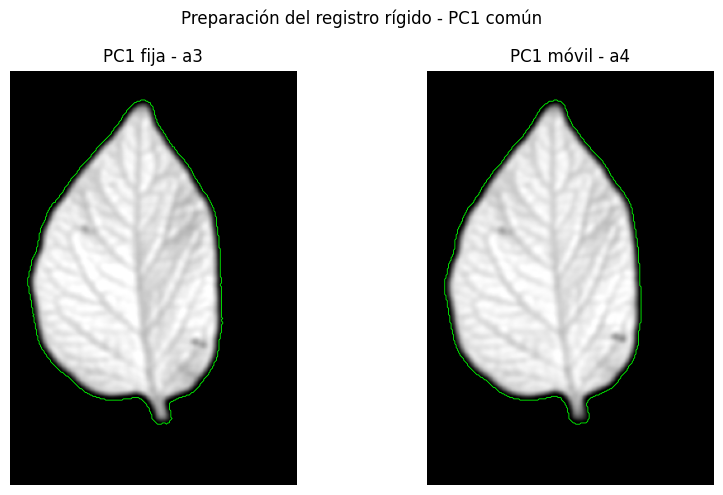

In [ ]:

# Celda 57 - Preparar PC1 de a3 y a4 para el registro rígido

!pip -q install SimpleITK

import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt

# Extraer PC1 del PCA común
pc1_fija = pca_fija[:, :, 0].copy()
pc1_movil = pca_movil[:, :, 0].copy()

# Normalización compartida calculada sobre las regiones de interés
valores = np.concatenate([
    pc1_fija[mask_fija],
    pc1_movil[mask_movil]
])

p_min, p_max = np.percentile(valores, [2, 98])

def normalizar_registro(imagen, minimo, maximo):
    if maximo <= minimo:
        raise ValueError('Los límites de normalización no son válidos.')

    resultado = (imagen - minimo) / (maximo - minimo)
    return np.clip(resultado, 0, 1).astype(np.float32)

pc1_fija_norm = normalizar_registro(pc1_fija, p_min, p_max)
pc1_movil_norm = normalizar_registro(pc1_movil, p_min, p_max)

# Convertir a imágenes SimpleITK
sitk_fija = sitk.GetImageFromArray(pc1_fija_norm)
sitk_movil = sitk.GetImageFromArray(pc1_movil_norm)

# Máscaras para la optimización
sitk_mask_fija = sitk.GetImageFromArray(mask_fija.astype(np.uint8))
sitk_mask_movil = sitk.GetImageFromArray(mask_movil.astype(np.uint8))

# Verificación
print('Preparación del registro rígido')
print('-' * 45)
print('Referencia:', f'a{DIA_FIJO}')
print('Móvil:', f'a{DIA_MOVIL}')

print('\nDimensiones SimpleITK:')
print('Fija:', sitk_fija.GetSize())
print('Móvil:', sitk_movil.GetSize())

print('\nNormalización compartida:')
print(f'Percentil 2:  {p_min:.6f}')
print(f'Percentil 98: {p_max:.6f}')

print('\nRangos normalizados:')
print('Fija:', pc1_fija_norm.min(), pc1_fija_norm.max())
print('Móvil:', pc1_movil_norm.min(), pc1_movil_norm.max())

# Visualización
fig, axes = plt.subplots(1, 2, figsize=(9, 5))

axes[0].imshow(pc1_fija_norm, cmap='gray', vmin=0, vmax=1)
axes[0].contour(mask_fija, colors='lime', linewidths=0.6)
axes[0].set_title('PC1 fija - a3')

axes[1].imshow(pc1_movil_norm, cmap='gray', vmin=0, vmax=1)
axes[1].contour(mask_movil, colors='lime', linewidths=0.6)
axes[1].set_title('PC1 móvil - a4')

for ax in axes:
    ax.axis('off')

plt.suptitle('Preparación del registro rígido - PC1 común')
plt.tight_layout()
plt.show()

In [ ]:

# Celda 58 - Registro rígido temporal a3 <- a4 utilizando PC1

import SimpleITK as sitk
import numpy as np

# Inicializar transformación rígida 2D
transformacion_inicial = sitk.CenteredTransformInitializer(
    sitk_fija,
    sitk_movil,
    sitk.Euler2DTransform(),
    sitk.CenteredTransformInitializerFilter.GEOMETRY
)

# Configurar el método de registro
registro = sitk.ImageRegistrationMethod()

# Métrica de similitud
registro.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)

# Restringir la métrica a las regiones de interés
registro.SetMetricFixedMask(sitk_mask_fija)
registro.SetMetricMovingMask(sitk_mask_movil)

# Muestreo completo para este primer experimento
registro.SetMetricSamplingStrategy(registro.NONE)

# Interpolación durante la optimización
registro.SetInterpolator(sitk.sitkLinear)

# Optimizador
registro.SetOptimizerAsRegularStepGradientDescent(
    learningRate=1.0,
    minStep=1e-5,
    numberOfIterations=300,
    gradientMagnitudeTolerance=1e-8
)

# Escalado automático de los parámetros
registro.SetOptimizerScalesFromPhysicalShift()

# Inicializar transformación
registro.SetInitialTransform(transformacion_inicial, inPlace=False)

# Registro multirresolución
registro.SetShrinkFactorsPerLevel([4, 2, 1])
registro.SetSmoothingSigmasPerLevel([2, 1, 0])
registro.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()

# Ejecutar registro
transformacion_rigida = registro.Execute(sitk_fija, sitk_movil)

# Resultados
print('Registro rígido temporal a3 <- a4')
print('-' * 50)

print(f'Métrica final: {registro.GetMetricValue():.6f}')
print(f'Iteraciones último nivel: {registro.GetOptimizerIteration()}')
print(f'Condición de parada: {registro.GetOptimizerStopConditionDescription()}')

print('\nTransformación estimada:')
print(transformacion_rigida)

Registro rígido temporal a3 <- a4
--------------------------------------------------
Métrica final: -1.041602
Iteraciones último nivel: 29
Condición de parada: RegularStepGradientDescentOptimizerv4: Step too small after 28 iterations. Current step (7.62939e-06) is less than minimum step (1e-05).

Transformación estimada:
itk::simple::CompositeTransform
 CompositeTransform (0x45749a80)
   RTTI typeinfo:   itk::CompositeTransform<double, 2u>
   Reference Count: 1
   Modified Time: 3406
   Debug: Off
   Object Name: 
   Observers: 
     none
   TransformQueue: 
   >>>>>>>>>
   Euler2DTransform (0x43ae1340)
     RTTI typeinfo:   itk::Euler2DTransform<double>
     Reference Count: 1
     Modified Time: 3396
     Debug: Off
     Object Name: 
     Observers: 
       none
     Matrix: 
       0.999667 0.0258195 
       -0.0258195 0.999667 
     Offset: [-4.05326, 2.25454]
     Center: [112.5, 163]
     Translation: [0.117808, -0.704495]
     Inverse: 
       0.999667 -0.0258195 
       0.0258

Evaluación del registro rígido a3 <- a4
--------------------------------------------------
Dice inicial:     0.986835
Dice registrado:  0.986332
Diferencia Dice:  -0.000503

IoU inicial:      0.974012
IoU registrado:   0.973033
Diferencia IoU:   -0.000980

Píxeles máscara fija:       26734
Píxeles máscara registrada: 26968


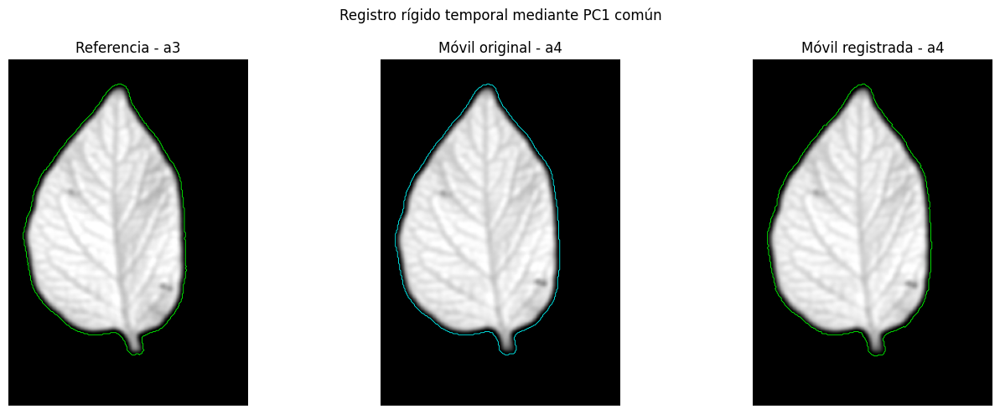

In [ ]:

# Celda 59 - Aplicar la transformación rígida a PC1 y a la máscara de a4

import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt

# Remuestrear PC1 móvil sobre el sistema de coordenadas de a3
sitk_movil_registrada = sitk.Resample(
    sitk_movil,
    sitk_fija,
    transformacion_rigida,
    sitk.sitkLinear,
    0.0,
    sitk.sitkFloat32
)

# Remuestrear la máscara móvil mediante vecino más cercano
sitk_mask_movil_registrada = sitk.Resample(
    sitk_mask_movil,
    sitk_mask_fija,
    transformacion_rigida,
    sitk.sitkNearestNeighbor,
    0,
    sitk.sitkUInt8
)

# Convertir nuevamente a NumPy
pc1_movil_registrada = sitk.GetArrayFromImage(sitk_movil_registrada)
mask_movil_registrada = sitk.GetArrayFromImage(sitk_mask_movil_registrada).astype(bool)

# Evaluación cuantitativa
interseccion_reg = np.logical_and(mask_fija, mask_movil_registrada).sum()
union_reg = np.logical_or(mask_fija, mask_movil_registrada).sum()

dice_rigido = 2 * interseccion_reg / (mask_fija.sum() + mask_movil_registrada.sum())
iou_rigido = interseccion_reg / union_reg

# Resultados
print('Evaluación del registro rígido a3 <- a4')
print('-' * 50)

print(f'Dice inicial:     {dice_inicial:.6f}')
print(f'Dice registrado:  {dice_rigido:.6f}')
print(f'Diferencia Dice:  {dice_rigido - dice_inicial:+.6f}')

print()

print(f'IoU inicial:      {iou_inicial:.6f}')
print(f'IoU registrado:   {iou_rigido:.6f}')
print(f'Diferencia IoU:   {iou_rigido - iou_inicial:+.6f}')

print()

print(f'Píxeles máscara fija:       {mask_fija.sum()}')
print(f'Píxeles máscara registrada: {mask_movil_registrada.sum()}')

# Visualización
fig, axes = plt.subplots(1, 3, figsize=(14, 5))

axes[0].imshow(pc1_fija_norm, cmap='gray', vmin=0, vmax=1)
axes[0].contour(mask_fija, colors='lime', linewidths=0.6)
axes[0].set_title('Referencia - a3')

axes[1].imshow(pc1_movil_norm, cmap='gray', vmin=0, vmax=1)
axes[1].contour(mask_movil, colors='cyan', linewidths=0.6)
axes[1].set_title('Móvil original - a4')

axes[2].imshow(pc1_movil_registrada, cmap='gray', vmin=0, vmax=1)
axes[2].contour(mask_movil_registrada, colors='lime', linewidths=0.6)
axes[2].set_title('Móvil registrada - a4')

for ax in axes:
    ax.axis('off')

plt.suptitle('Registro rígido temporal mediante PC1 común')
plt.tight_layout()
plt.show()

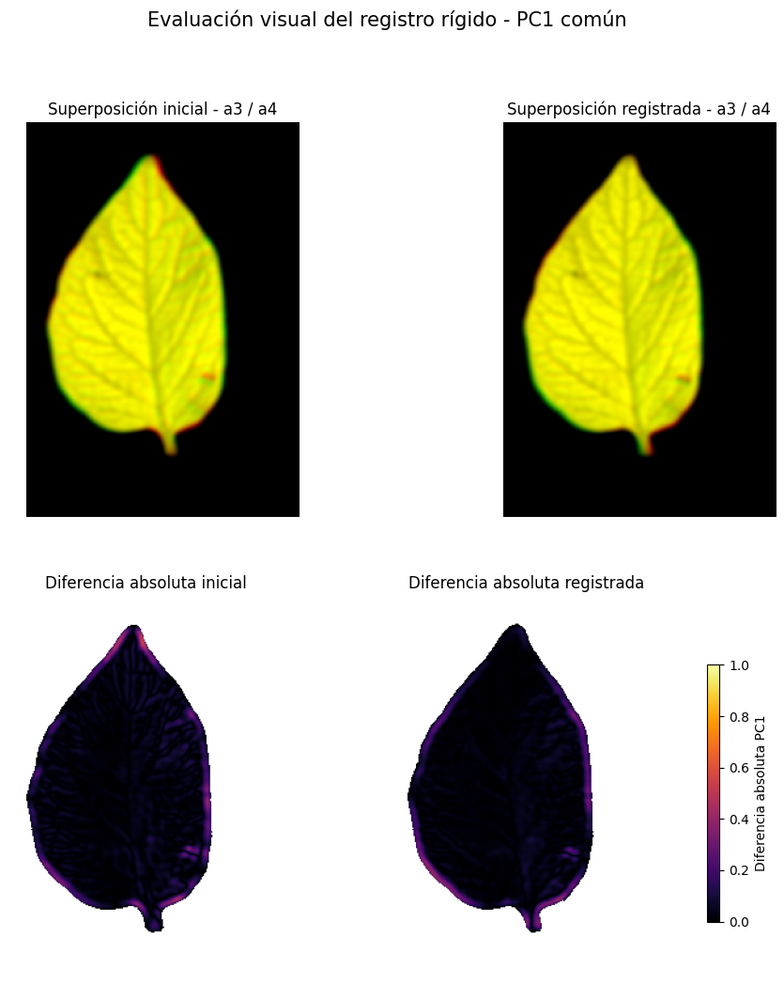

Comparación de intensidades PC1
---------------------------------------------
Píxeles comparados: 26363
MAE inicial:        0.045254
MAE registrada:     0.037498
Diferencia MAE:     -0.007756


In [ ]:

# Celda 60 - Evaluación visual del registro rígido temporal

import numpy as np
import matplotlib.pyplot as plt

# Imágenes de referencia y móvil
fija = pc1_fija_norm
movil = pc1_movil_norm
registrada = pc1_movil_registrada

# Regiones válidas de comparación
roi_inicial = mask_fija & mask_movil
roi_registrada = mask_fija & mask_movil_registrada

# Superposiciones RGB
superposicion_inicial = np.zeros((*fija.shape, 3), dtype=np.float32)
superposicion_registrada = np.zeros((*fija.shape, 3), dtype=np.float32)

superposicion_inicial[..., 0] = fija
superposicion_inicial[..., 1] = movil

superposicion_registrada[..., 0] = fija
superposicion_registrada[..., 1] = registrada

# Diferencias absolutas dentro de las regiones comunes
diferencia_inicial = np.abs(fija - movil)
diferencia_registrada = np.abs(fija - registrada)

diferencia_inicial[~roi_inicial] = np.nan
diferencia_registrada[~roi_registrada] = np.nan

# Visualización
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

axes[0, 0].imshow(superposicion_inicial)
axes[0, 0].set_title('Superposición inicial - a3 / a4')

axes[0, 1].imshow(superposicion_registrada)
axes[0, 1].set_title('Superposición registrada - a3 / a4')

im1 = axes[1, 0].imshow(diferencia_inicial, cmap='inferno', vmin=0, vmax=1)
axes[1, 0].set_title('Diferencia absoluta inicial')

im2 = axes[1, 1].imshow(diferencia_registrada, cmap='inferno', vmin=0, vmax=1)
axes[1, 1].set_title('Diferencia absoluta registrada')

for ax in axes.flat:
    ax.axis('off')

fig.colorbar(im2, ax=axes[1, :], shrink=0.65, label='Diferencia absoluta PC1')

plt.suptitle('Evaluación visual del registro rígido - PC1 común', fontsize=15)
plt.show()

# Diferencia media sobre una región común idéntica
roi_comparacion = roi_inicial & roi_registrada

mae_inicial = np.mean(np.abs(fija[roi_comparacion] - movil[roi_comparacion]))
mae_registrada = np.mean(np.abs(fija[roi_comparacion] - registrada[roi_comparacion]))

print('Comparación de intensidades PC1')
print('-' * 45)
print(f'Píxeles comparados: {roi_comparacion.sum()}')
print(f'MAE inicial:        {mae_inicial:.6f}')
print(f'MAE registrada:     {mae_registrada:.6f}')
print(f'Diferencia MAE:     {mae_registrada - mae_inicial:+.6f}')